In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as pl
import seaborn as sns
import bbknn
import scvelo as scv
import anndata
import leidenalg
import loompy
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
from matplotlib.pyplot import rc_context
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import os
import random

C:\Users\tpsa222\.conda\envs\young\lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\tpsa222\.conda\envs\young\lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\tpsa222\.conda\envs\young\lib\site-packages\umap\distances.py:1086: NumbaDeprecatio

In [2]:
sc.set_figure_params(format='png')  # for beautified visualization
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params(style='scvelo', format='png')  # for beautified visualization

In [3]:
# Set working directory
os.chdir("Y:/Tolulope/Cellranger Results/transyoung")

Sham_GFP = 'Y:/Tolulope/Cellranger Results/transyoung/Sham_GFP/filtered_feature_bc_matrix'
Sham_noGFP = 'Y:/Tolulope/Cellranger Results/transyoung/Sham_noGFP/filtered_feature_bc_matrix'
OV_GFP = 'Y:/Tolulope/Cellranger Results/transyoung/OV_GFP/filtered_feature_bc_matrix'
OV_noGFP = 'Y:/Tolulope/Cellranger Results/transyoung/OV_noGFP/filtered_feature_bc_matrix'

In [4]:
# Read the 10x Genomics data into an AnnData object
adata1 = sc.read_10x_mtx(
    Sham_GFP,                 # Path to the directory with the `.mtx` file
    var_names='gene_symbols',  # Use gene symbols for variable names
    cache=True                 # Write a cache file for faster subsequent reading
)

# Read the 10x Genomics data into an AnnData object
adata2 = sc.read_10x_mtx(
    Sham_noGFP,                 # Path to the directory with the `.mtx` file
    var_names='gene_symbols',  # Use gene symbols for variable names
    cache=True                 # Write a cache file for faster subsequent reading
)
# Read the 10x Genomics data into an AnnData object
adata3 = sc.read_10x_mtx(
    OV_GFP,                 # Path to the directory with the `.mtx` file
    var_names='gene_symbols',  # Use gene symbols for variable names
    cache=True                 # Write a cache file for faster subsequent reading
)
# Read the 10x Genomics data into an AnnData object
adata4 = sc.read_10x_mtx(
    OV_noGFP,                 # Path to the directory with the `.mtx` file
    var_names='gene_symbols',  # Use gene symbols for variable names
    cache=True                 # Write a cache file for faster subsequent reading
)

# Now `adata1,2,3,4` contains your 10x Genomics data in an AnnData object

In [5]:
adata1.var_names_make_unique()    # unnecessary if `var_names='gene_ids'`
adata2.var_names_make_unique() 
adata3.var_names_make_unique() 
adata4.var_names_make_unique() 

In [6]:
adata1.raw = adata1
adata2.raw = adata2
adata3.raw = adata3
adata4.raw = adata4

In [7]:
adata = adata1.concatenate([adata2,adata3,adata4], batch_categories=['Sham_GFP', 'Sham_noGFP', 'OV_GFP', 'OV_noGFP'])

In [8]:
# Set raw counts in the 'counts' layer
adata.layers['counts'] = adata.X.copy()

In [9]:
adata

AnnData object with n_obs × n_vars = 24632 × 33768
    obs: 'batch'
    var: 'gene_ids', 'feature_types'
    layers: 'counts'

In [10]:
adata.obs['Sample'] = adata.obs['batch']
adata.obs.drop('batch', axis=1, inplace=True)


In [11]:
adata.obs

,Sample
AAACCCAGTTCCGTTC-1-Sham_GFP,Sham_GFP
AAACCCATCCATACTT-1-Sham_GFP,Sham_GFP
AAACCCATCCCACAGG-1-Sham_GFP,Sham_GFP
AAACGAACATACCACA-1-Sham_GFP,Sham_GFP
AAACGAAGTCGTGGTC-1-Sham_GFP,Sham_GFP
...,...
TTTGTTGAGATGGCGT-1-OV_noGFP,OV_noGFP
TTTGTTGCACCGAATT-1-OV_noGFP,OV_noGFP
TTTGTTGCATCCTTCG-1-OV_noGFP,OV_noGFP
TTTGTTGGTCAGGAGT-1-OV_noGFP,OV_noGFP


In [12]:
# filter
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.filter_cells(adata, min_genes=200)

In [13]:
adata.var['mt']= adata.var_names.str.startswith('mt-') # annotate the group of mitochondrial genes
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

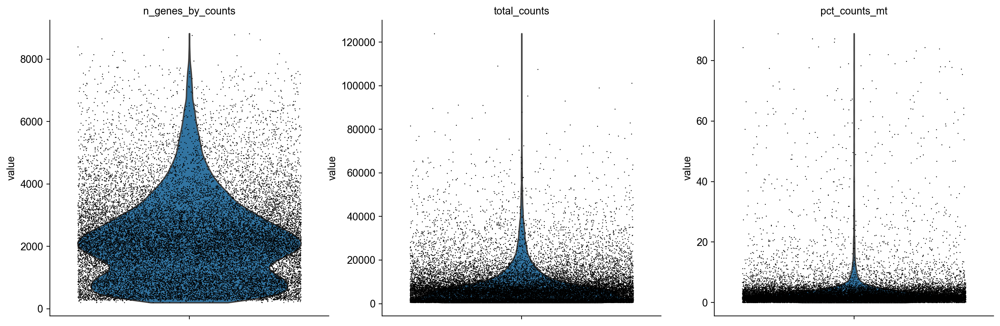

In [14]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, save='violin_plot.png')

In [15]:
adata=adata[adata.obs.n_genes_by_counts < 8000, :]
adata=adata[adata.obs.total_counts < 40000, :]
adata=adata[adata.obs.pct_counts_mt < 15, :]

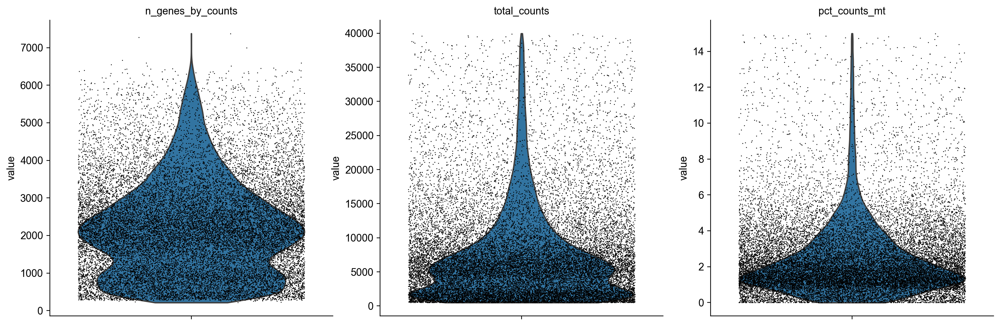

In [16]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, save='violin_plot.png')

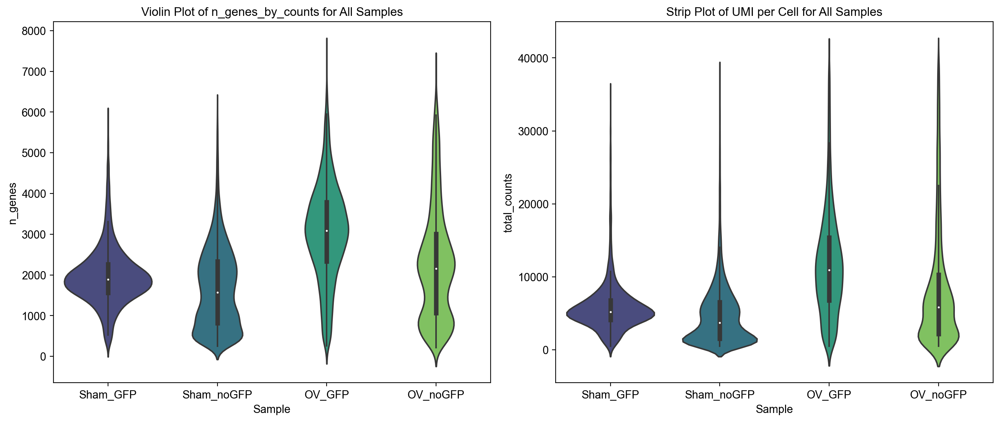

In [17]:
pl.figure(figsize=(14, 6))

# Violin plot for n_genes_by_counts
pl.subplot(1, 2, 1)
sns.violinplot(x='Sample', y='n_genes', data=adata.obs, palette='viridis')
pl.title('Violin Plot of n_genes_by_counts for All Samples')



adata.obs['total_counts']=adata.X.sum(axis=1)
pl.subplot(1, 2, 2)
#sns.stripplot(x='batch', y=adata5.X.sum(axis=1).A1, data=adata.obs, palette='viridis', jitter=True)
sns.violinplot(x='Sample', y='total_counts', data=adata.obs, palette='viridis')
pl.title('Strip Plot of UMI per Cell for All Samples')


pl.tight_layout()

# Save the plot
pl.savefig('violin_plot.png')  # You can specify a different file format (e.g., .pdf, .svg) if needed
pl.show()

In [18]:
adata

AnnData object with n_obs × n_vars = 23528 × 24401
    obs: 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'counts'

In [19]:
adata.X.sum(axis=1)

matrix([[11059.],
        [ 7142.],
        [ 5501.],
        ...,
        [ 8288.],
        [ 3544.],
        [ 7337.]], dtype=float32)

In [20]:
sc.pp.normalize_total(adata, target_sum=1e4)

In [21]:
adata.X.sum(axis=1)

matrix([[10000.   ],
        [ 9999.999],
        [10000.   ],
        ...,
        [10000.   ],
        [10000.   ],
        [10000.   ]], dtype=float32)

In [22]:
adata

AnnData object with n_obs × n_vars = 23528 × 24401
    obs: 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'counts'

In [23]:
sc.pp.log1p(adata)

In [24]:
adata.X.sum(axis=1)

matrix([[3810.1868],
        [3053.7664],
        [2852.1592],
        ...,
        [3180.5278],
        [2592.2397],
        [3259.6328]], dtype=float32)

In [25]:
adata

AnnData object with n_obs × n_vars = 23528 × 24401
    obs: 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p'
    layers: 'counts'

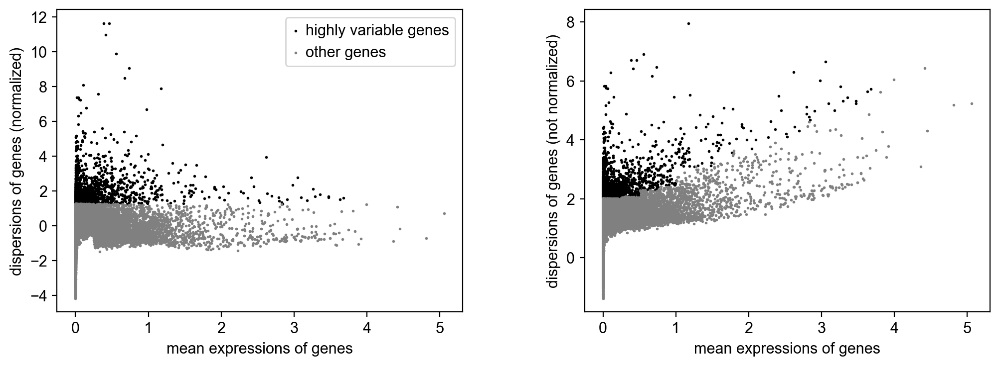

In [26]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, n_bins=20,  n_top_genes=2000)

projID = "vaiable genes_1"  # Define projID with a specific value, such as a string representing your project ID
n1 = 1  # Define n1 with a specific numerical value

sc.pl.highly_variable_genes(adata, save=f"{projID}_high_variable_{n1}.png")

In [27]:
sc.pp.scale(adata, max_value=10) 

In [28]:
sc.tl.pca(adata, svd_solver='arpack')

In [29]:
#sc.pp.neighbors(adata)

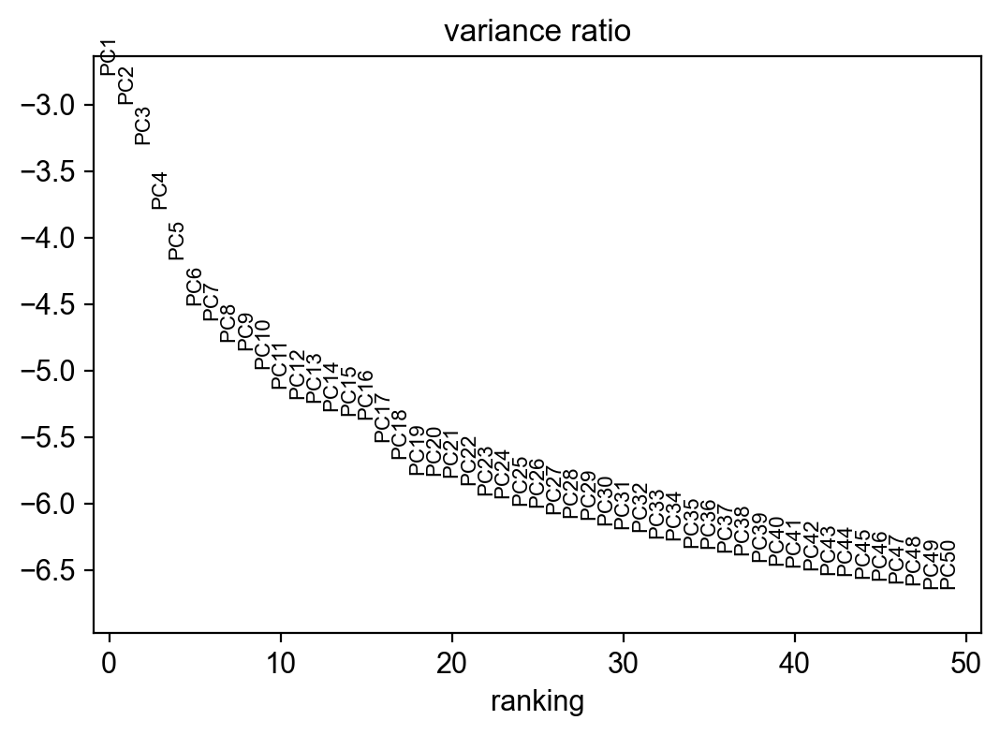

In [30]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

In [31]:
sc.pp.neighbors(adata, n_pcs=30)

In [32]:
sc.tl.umap(adata)

In [33]:
sc.tl.leiden(adata, resolution = 0.8)

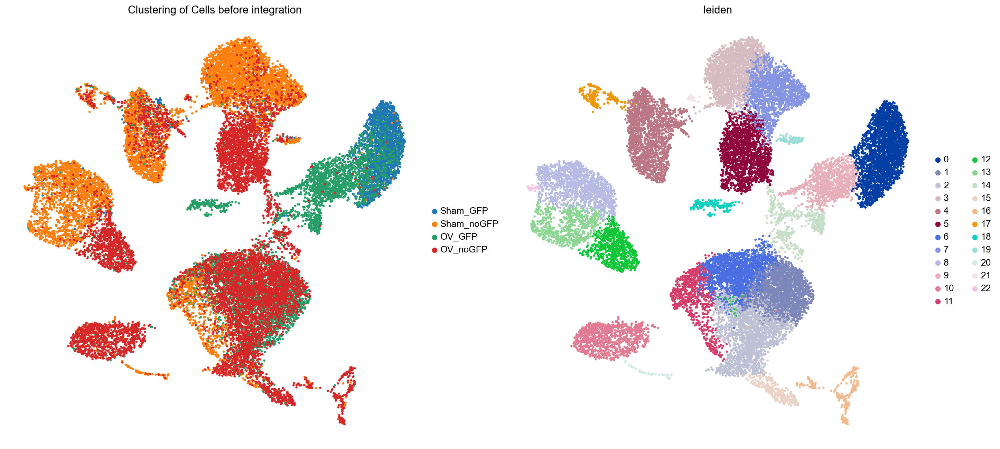

In [34]:
# Customize UMAP plot
sc.set_figure_params(figsize=(10, 10))
img_tag = "_color"  # Specify your image tag here
sc.pl.umap(adata, color=['Sample', 'leiden'], legend_fontsize=12, legend_fontoutline=2, frameon=False, size=35, title='Clustering of Cells before integration', save=f'umap_plot{img_tag}.png')

In [35]:
adata

AnnData object with n_obs × n_vars = 23528 × 24401
    obs: 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'Sample_colors', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [36]:
#BBKNN
sc.external.pp.bbknn(adata, batch_key="Sample")

In [37]:
sc.tl.umap(adata)

In [38]:
sc.tl.leiden(adata, resolution = 0.8)

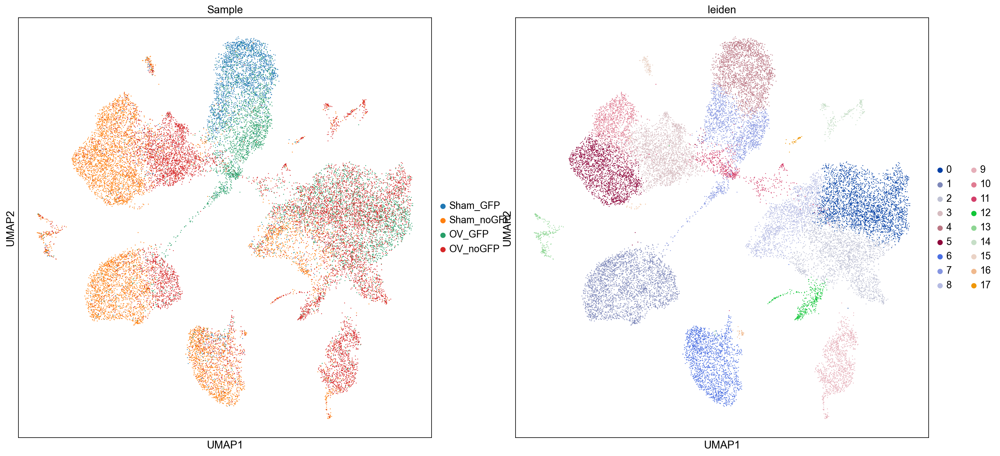

In [39]:
sc.pl.umap(adata, color=['Sample', 'leiden'])

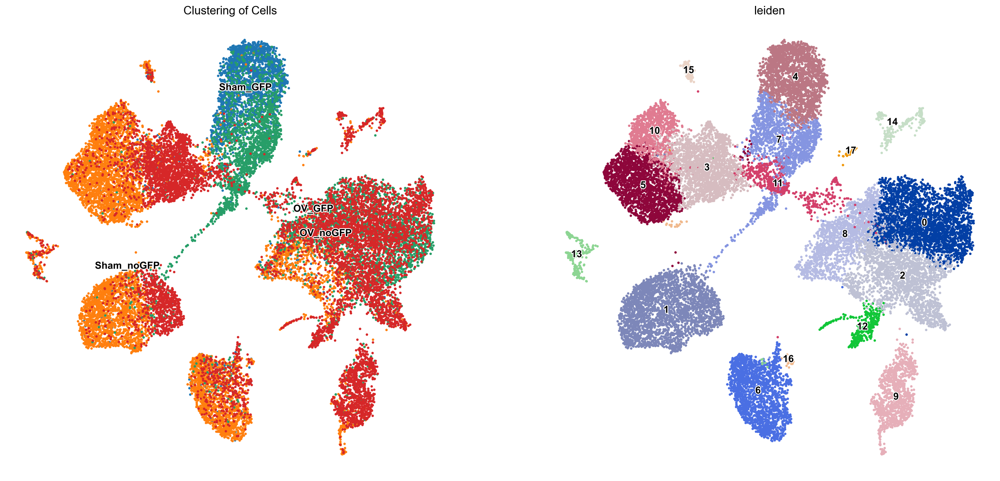

In [40]:

# Customize UMAP plot
sc.set_figure_params(figsize=(10, 10))
img_tag = "_color"  # Specify your image tag here
sc.pl.umap(adata, color=['Sample', 'leiden'], legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, frameon=False, size=35, title='Clustering of Cells', save=f'umap_plot{img_tag}.png')
pl.show()

In [41]:
RedsModified = cm.get_cmap('Reds', 12)
RedsModified = cm.get_cmap('Reds', 256)
newcolors = RedsModified(np.linspace(0, 1, 256))
grey = np.array([220/256, 220/256, 220/256, 1])

# Modify this val to change the 
# area that will be grey on the cmap
lim = 10
newcolors[:lim, :] = grey
newcmp = ListedColormap(newcolors)

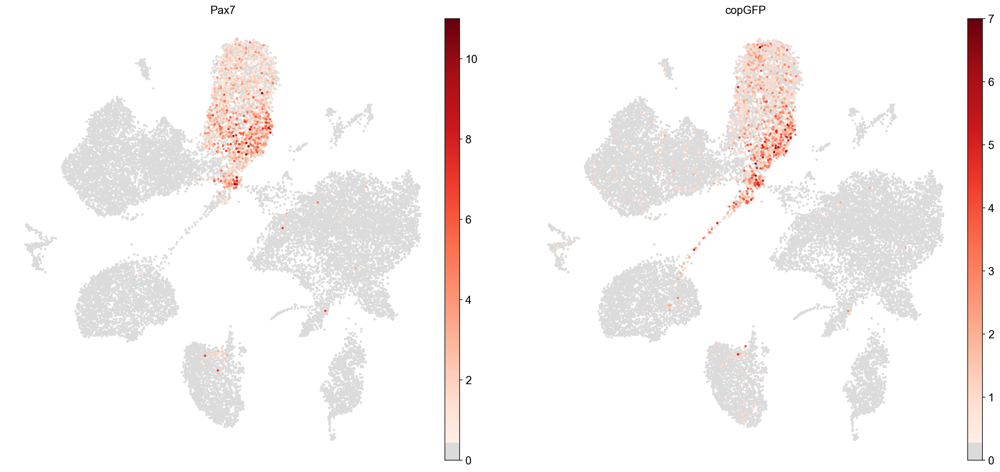

In [42]:
sc.pl.umap(adata, color=["Pax7", "copGFP"],  legend_fontsize=12, legend_fontoutline=12,
           frameon=False, size=35,cmap=newcmp, use_raw=True, save=f'umap_plot{img_tag}.png')
# Show the UMAP plot
pl.show()


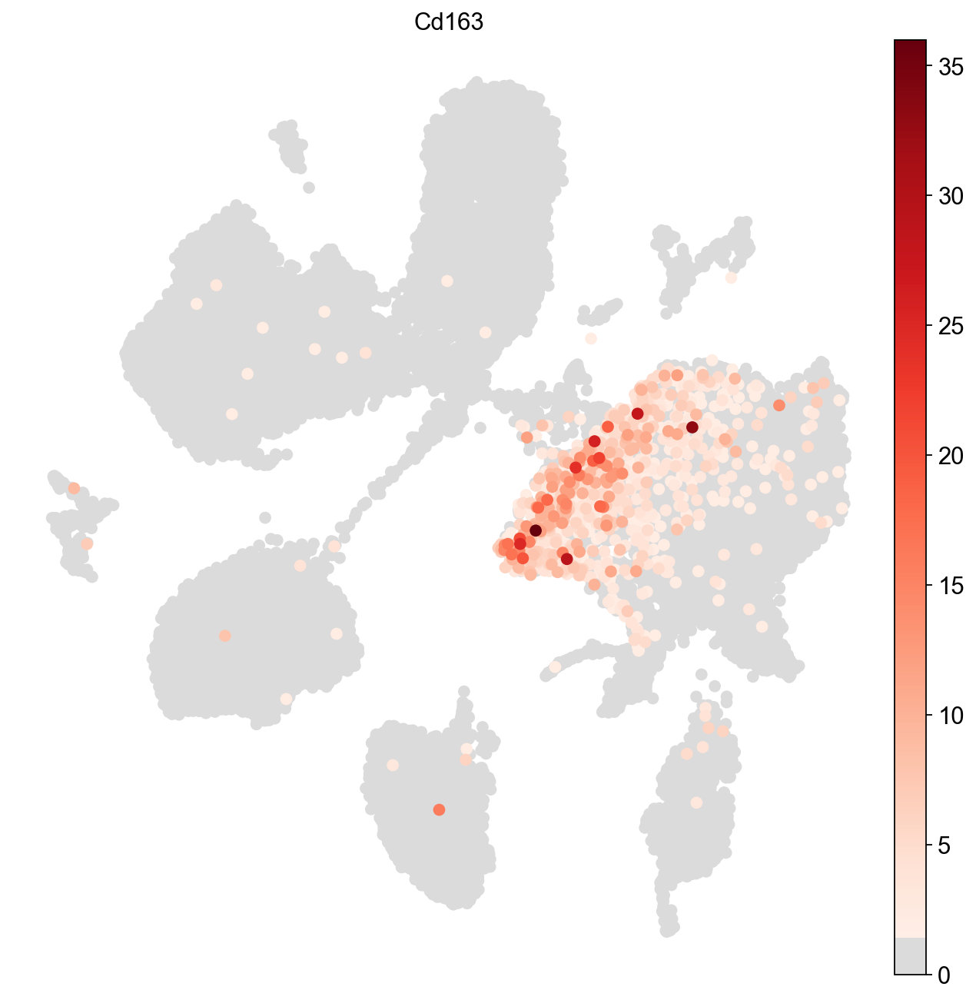

In [49]:
sc.pl.umap(adata, color=["Cd163"],  legend_fontsize=12, legend_fontoutline=12,
           frameon=False, size=200,cmap=newcmp, use_raw=True, save=f'umap_plot{img_tag}.png')
# Show the UMAP plot
pl.show()


In [41]:
sc.write("adata.h5ad", adata)

In [43]:
cell_type = {
    "0": "Monocytes/macrophages/Platelet",
    "1": "Mature type IIA and IIB fiber",
    "2": "Residence Macrophages/APC 1",
    "3": "Myo-Fibroblast",
    "4": "MuSCs and Myoblasts",
    "5": "Fibroblast",
    "6": "Endothelial cells 1",
    "7": "MuSCs and myogenic progenitor cells",
    "8": "Anti-inflammatory Macrophages",
    "9": "Neutrophils",
    "10": "Fibroblast2",
    "11": "Proliferating MuSCs and immune cells",
    "12": "Residence Macrophages/APC 2",
    "13": "Pericyte cells",
    "14": "T-lymphocytes and Natural killer cells",
    "15": "Tenocyte",
    "16": "Endothelial cells 2",
    "17": "Schwann cells",
   
}

In [53]:
#cell_type = {
    "0": "Monocytes/macrophages/Platelet",
    "1": "Mature type IIA and IIB fiber",
    "2": "Residence Macrophages/APC",
    "3": "Myo-Fibroblast",
    "4": "MuSCs and Myoblasts",
    "5": "Fibroblast",
    "6": "Endothelial cells",
    "7": "MuSCs and myogenic progenitor cells",
    "8": "Anti-inflammatory Macrophages",
    "9": "Neutrophils",
    "10": "Fibroblast",
    "11": "Proliferating MuSCs and immune cells",
    "12": "Residence Macrophages/APC",
    "13": "Pericyte cells",
    "14": "T-lymphocytes and Natural killer cells",
    "15": "Tenocyte",
    "16": "Endothelial cells",
    "17": "Schwann cells",
   
}

In [44]:
adata.obs.leiden.map(cell_type)

AAACCCAGTTCCGTTC-1-Sham_GFP               Endothelial cells 1
AAACCCATCCATACTT-1-Sham_GFP               MuSCs and Myoblasts
AAACCCATCCCACAGG-1-Sham_GFP               MuSCs and Myoblasts
AAACGAACATACCACA-1-Sham_GFP               MuSCs and Myoblasts
AAACGAAGTCGTGGTC-1-Sham_GFP               MuSCs and Myoblasts
                                            ...              
TTTGTTGAGATGGCGT-1-OV_noGFP    Monocytes/macrophages/Platelet
TTTGTTGCACCGAATT-1-OV_noGFP     Anti-inflammatory Macrophages
TTTGTTGCATCCTTCG-1-OV_noGFP    Monocytes/macrophages/Platelet
TTTGTTGGTCAGGAGT-1-OV_noGFP       Residence Macrophages/APC 1
TTTGTTGGTTGTGCAT-1-OV_noGFP    Monocytes/macrophages/Platelet
Name: leiden, Length: 23528, dtype: category
Categories (18, object): ['Monocytes/macrophages/Platelet', 'Mature type IIA and IIB fiber', 'Residence Macrophages/APC 1', 'Myo-Fibroblast', ..., 'T-lymphocytes and Natural killer cells', 'Tenocyte', 'Endothelial cells 2', 'Schwann cells']

In [45]:
adata.obs['cell type'] = adata.obs.leiden.map(cell_type)

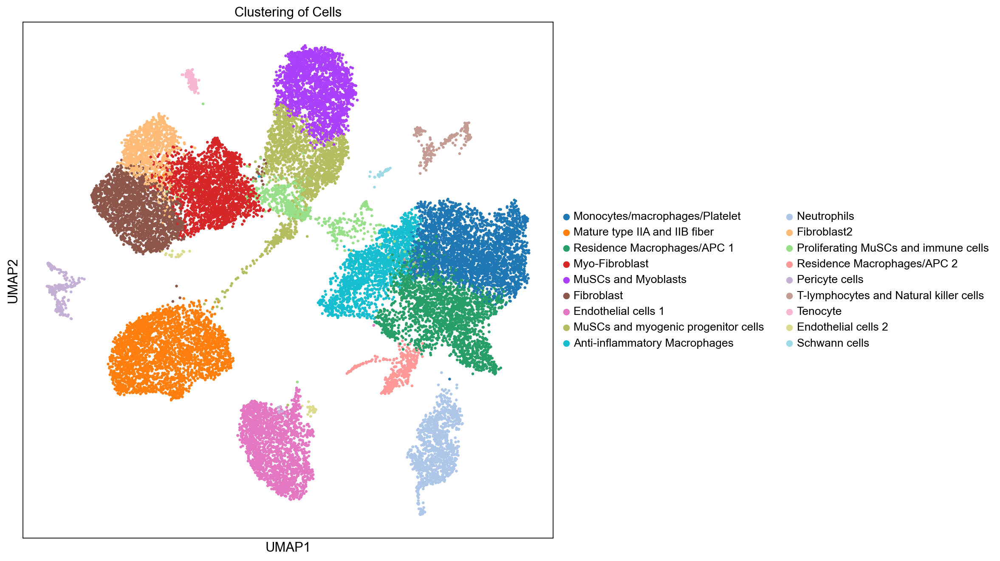

In [46]:


# Customize UMAP plot
sc.set_figure_params(figsize=(10, 10))
img_tag = "_color"  # Specify your image tag here
sc.pl.umap(adata, color=['cell type'],  legend_fontsize=12, legend_fontoutline=2, frameon=True, size=35, title='Clustering of Cells', save=f'umap_plot{img_tag}.png')
pl.show()

In [310]:
adata.obs['Sample'].unique().tolist()

['Sham_GFP', 'Sham_noGFP', 'OV_GFP', 'OV_noGFP']

In [311]:
def map_condition(x):
    if 'Sham_GFP' in x:
        return 'Sham_GFP'
    elif 'Sham_noGFP' in x:
        return 'Sham_noGFP'
    elif 'OV_GFP' in x:
        return 'OV_GFP'
    else:
        return 'OV_noGFP'

adata.obs['condition'] = adata.obs.Sample.map(map_condition)
adata.obs


,Sample,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell type,condition
AAACCCAGTTCCGTTC-1-Sham_GFP,Sham_GFP,3572,3572,11059.0,432.0,3.906321,6,Endothelial cells 1,Sham_GFP
AAACCCATCCATACTT-1-Sham_GFP,Sham_GFP,2373,2373,7142.0,280.0,3.920470,4,MuSCs and Myoblasts,Sham_GFP
AAACCCATCCCACAGG-1-Sham_GFP,Sham_GFP,2003,2003,5501.0,139.0,2.526813,4,MuSCs and Myoblasts,Sham_GFP
AAACGAACATACCACA-1-Sham_GFP,Sham_GFP,2215,2215,6809.0,175.0,2.570128,4,MuSCs and Myoblasts,Sham_GFP
AAACGAAGTCGTGGTC-1-Sham_GFP,Sham_GFP,2247,2247,6941.0,388.0,5.589973,4,MuSCs and Myoblasts,Sham_GFP
...,...,...,...,...,...,...,...,...,...
TTTGTTGAGATGGCGT-1-OV_noGFP,OV_noGFP,1633,1633,3283.0,175.0,5.330490,0,Monocytes/macrophages/Platelet,OV_noGFP
TTTGTTGCACCGAATT-1-OV_noGFP,OV_noGFP,4213,4213,19380.0,352.0,1.816306,8,Anti-inflammatory Macrophages,OV_noGFP
TTTGTTGCATCCTTCG-1-OV_noGFP,OV_noGFP,2729,2729,8288.0,163.0,1.966699,0,Monocytes/macrophages/Platelet,OV_noGFP
TTTGTTGGTCAGGAGT-1-OV_noGFP,OV_noGFP,1561,1561,3544.0,58.0,1.636569,2,Residence Macrophages/APC 1,OV_noGFP


In [312]:
adata.obs.groupby(['Sample']).count()

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell type,condition
Sample,,,,,,,,
Sham_GFP,2659,2659,2659,2659,2659,2659,2659,2659
Sham_noGFP,7950,7950,7950,7950,7950,7950,7950,7950
OV_GFP,4593,4593,4593,4593,4593,4593,4593,4593
OV_noGFP,8326,8326,8326,8326,8326,8326,8326,8326


In [313]:
num_tot_cells = adata.obs.groupby(['Sample']).count()
num_tot_cells = dict(zip(num_tot_cells.index, num_tot_cells.n_genes))
num_tot_cells

{'Sham_GFP': 2659, 'Sham_noGFP': 7950, 'OV_GFP': 4593, 'OV_noGFP': 8326}

In [314]:
cell_type_counts = adata.obs.groupby(['Sample', 'condition', 'cell type']).count()
cell_type_counts = cell_type_counts[cell_type_counts.sum(axis = 1) > 0].reset_index()

cell_type_counts

,Sample,condition,cell type,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
0,Sham_GFP,Sham_GFP,Monocytes/macrophages/Platelet,3,3,3,3,3,3
1,Sham_GFP,Sham_GFP,Mature type IIA and IIB fiber,48,48,48,48,48,48
2,Sham_GFP,Sham_GFP,Residence Macrophages/APC 1,26,26,26,26,26,26
3,Sham_GFP,Sham_GFP,Myo-Fibroblast,56,56,56,56,56,56
4,Sham_GFP,Sham_GFP,MuSCs and Myoblasts,1758,1758,1758,1758,1758,1758
...,...,...,...,...,...,...,...,...,...
63,OV_noGFP,OV_noGFP,Pericyte cells,66,66,66,66,66,66
64,OV_noGFP,OV_noGFP,T-lymphocytes and Natural killer cells,165,165,165,165,165,165
65,OV_noGFP,OV_noGFP,Tenocyte,24,24,24,24,24,24
66,OV_noGFP,OV_noGFP,Endothelial cells 2,8,8,8,8,8,8


In [315]:
cell_type_counts['total_cells'] = cell_type_counts.Sample.map(num_tot_cells).astype(int)

cell_type_counts['frequency'] = cell_type_counts.n_genes / cell_type_counts.total_cells

cell_type_counts

,Sample,condition,cell type,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,total_cells,frequency
0,Sham_GFP,Sham_GFP,Monocytes/macrophages/Platelet,3,3,3,3,3,3,2659,0.001128
1,Sham_GFP,Sham_GFP,Mature type IIA and IIB fiber,48,48,48,48,48,48,2659,0.018052
2,Sham_GFP,Sham_GFP,Residence Macrophages/APC 1,26,26,26,26,26,26,2659,0.009778
3,Sham_GFP,Sham_GFP,Myo-Fibroblast,56,56,56,56,56,56,2659,0.021061
4,Sham_GFP,Sham_GFP,MuSCs and Myoblasts,1758,1758,1758,1758,1758,1758,2659,0.661151
...,...,...,...,...,...,...,...,...,...,...,...
63,OV_noGFP,OV_noGFP,Pericyte cells,66,66,66,66,66,66,8326,0.007927
64,OV_noGFP,OV_noGFP,T-lymphocytes and Natural killer cells,165,165,165,165,165,165,8326,0.019817
65,OV_noGFP,OV_noGFP,Tenocyte,24,24,24,24,24,24,8326,0.002883
66,OV_noGFP,OV_noGFP,Endothelial cells 2,8,8,8,8,8,8,8326,0.000961


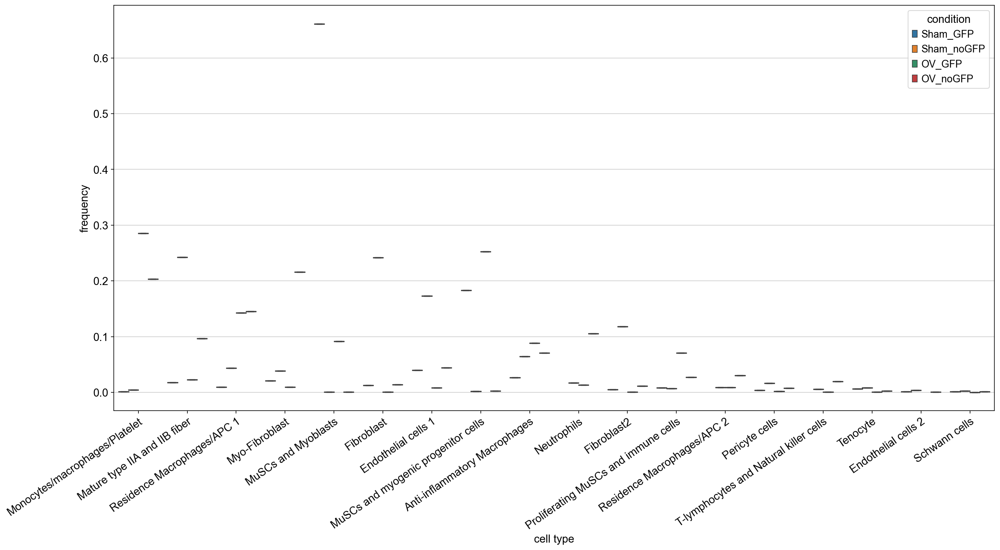

In [52]:
pl.figure(figsize = (18,10))

ax = sns.boxplot(data = cell_type_counts, x = 'cell type', y = 'frequency', hue = 'condition')

pl.xticks(rotation = 35, rotation_mode = 'anchor', ha = 'right')
pl.tight_layout()
pl.savefig('box_plot.png')

pl.show()

<Figure size 960x640 with 0 Axes>

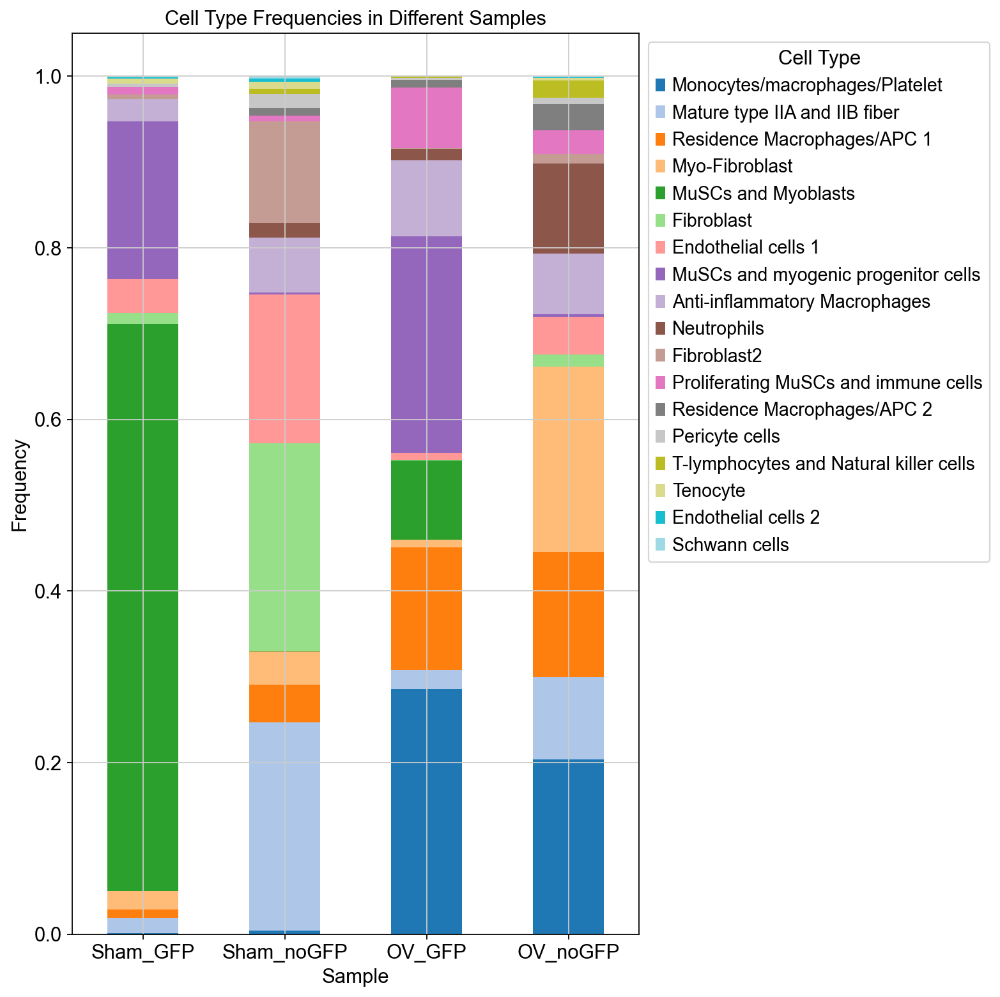

In [53]:
# Filter cell_type_counts to include only relevant columns
cell_type_counts = cell_type_counts[['Sample', 'condition', 'cell type', 'frequency']]

# Set the figure size
pl.figure(figsize=(12, 8))

# Define the order of samples in the plot
sample_order = ['Sham_GFP', 'Sham_noGFP', 'OV_GFP', 'OV_noGFP']

# Filter data for the specified samples
filtered_data = cell_type_counts[cell_type_counts['condition'].isin(sample_order)]

# Pivot the DataFrame for a stacked bar plot
stacked_data = filtered_data.pivot_table(index='condition', columns='cell type', values='frequency', fill_value=0)

# Create a stacked bar plot with distinct colors for each cell type
stacked_data.plot(kind='bar', stacked=True, colormap='tab20')

# Set plot properties
pl.xticks(rotation=0)  # Keep the x-axis labels horizontal
pl.xlabel('Sample')
pl.ylabel('Frequency')
pl.legend(title='Cell Type', bbox_to_anchor=(1, 1))  # Move the legend outside the plot area
pl.title('Cell Type Frequencies in Different Samples')
pl.tight_layout()
pl.savefig('bar4_plot.png')
# Show the plot
pl.show()

In [58]:
# Calculate percentages for each cell type across groups
percentage_data = stacked_data.div(stacked_data.sum(axis=1), axis=0) * 100
# Export percentages to a CSV file
percentage_data.to_csv('cell_type_percentages.csv', index=True)


Subset size: 23528 cells


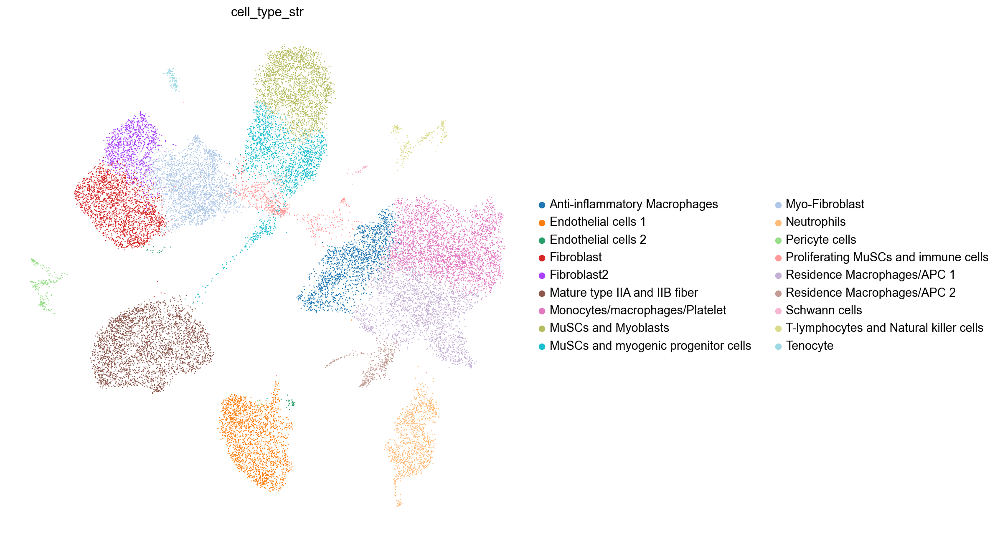

categories: Anti-inflammatory Macrophages, Endothelial cells 1, Endothelial cells 2, etc.
var_group_labels: Monocytes/macrophages/Platelet, Mature type IIA and IIB fiber, Residence Macrophages/APC 1, etc.


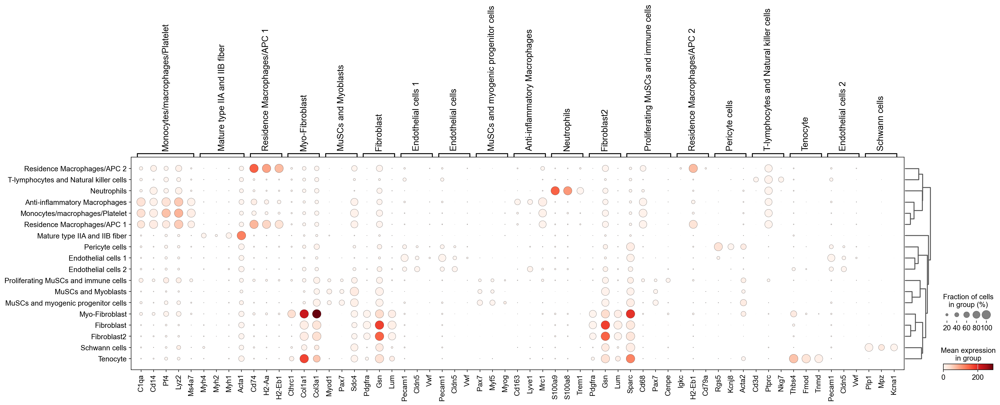

categories: Anti-inflammatory Macrophages, Endothelial cells 1, Endothelial cells 2, etc.
var_group_labels: Monocytes/macrophages/Platelet, Mature type IIA and IIB fiber, Residence Macrophages/APC 1, etc.


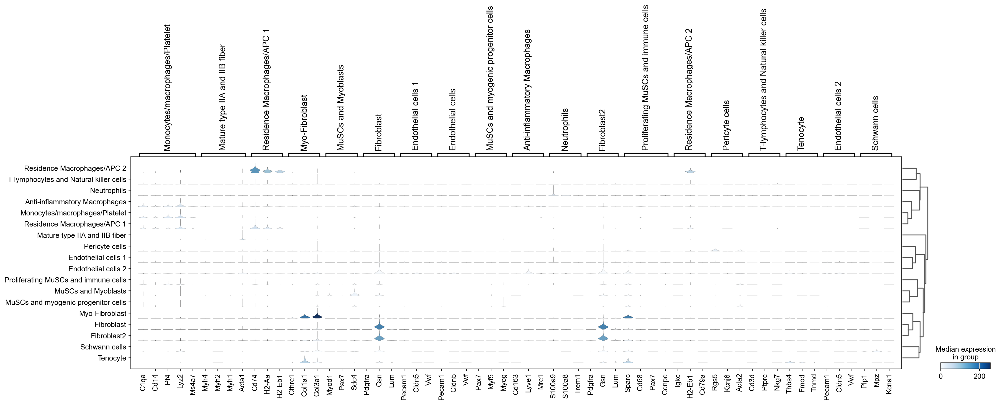

In [55]:
cell_type = {
    "0": "Monocytes/macrophages/Platelet",
    "1": "Mature type IIA and IIB fiber",
    "2": "Residence Macrophages/APC 1",
    "3": "Myo-Fibroblast",
    "4": "MuSCs and Myoblasts",
    "5": "Fibroblast",
    "6": "Endothelial cells 1",
    "7": "MuSCs and myogenic progenitor cells",
    "8": "Anti-inflammatory Macrophages",
    "9": "Neutrophils",
    "10": "Fibroblast2",
    "11": "Proliferating MuSCs and immune cells",
    "12": "Residence Macrophages/APC 2",
    "13": "Pericyte cells",
    "14": "T-lymphocytes and Natural killer cells",
    "15": "Tenocyte",
    "16": "Endothelial cells 2",
    "17": "Schwann cells",
   
}

# Convert 'leiden' values to string cell types
adata.obs['cell_type_str'] = adata.obs['leiden'].astype(str).map(cell_type)

# Define the desired cell types for subsetting
Mesen = [
    "Monocytes/macrophages/Platelet",
    "Mature type IIA and IIB fiber",
    "Residence Macrophages/APC 1",
    "Myo-Fibroblast",
    "MuSCs and Myoblasts",
    "Fibroblast",
    "Endothelial cells 1",
    "MuSCs and myogenic progenitor cells",
    "Anti-inflammatory Macrophages",
    "Neutrophils",
    "Fibroblast2",
    "Proliferating MuSCs and immune cells",
    "Residence Macrophages/APC 2",
    "Pericyte cells",
    "T-lymphocytes and Natural killer cells",
    "Tenocyte",
    "Endothelial cells 2",
    "Schwann cells"
]

# Filter cells based on the 'cell type' annotation using string values
adata_subset = adata[adata.obs.cell_type_str.isin(Mesen)]

# Print information about the subset size
print(f"Subset size: {len(adata_subset)} cells")

# Check if the subset is not empty before plotting
if len(adata_subset) > 0:
    # Plot UMAP with 'cell type' annotations
    sc.set_figure_params(figsize=(10, 10))
    sc.pl.umap(adata_subset, color=['cell_type_str'], frameon=False, save='umap_plot.png')

    # Plot and save the dot plot
    sc.set_figure_params(figsize=(10, 10))
    marker_genes_dict = {
        "Monocytes/macrophages/Platelet": ['C1qa', 'Cd14', 'Pf4', 'Lyz2', 'Ms4a7'],
        "Mature type IIA and IIB fiber": ['Myh4', 'Myh2', 'Myh1', 'Acta1'],
        "Residence Macrophages/APC 1": ['Cd74', 'H2-Aa', 'H2-Eb1'],
        "Myo-Fibroblast": ['Cthrc1', 'Col1a1', 'Col3a1'],
        "MuSCs and Myoblasts": ['Myod1', 'Pax7', 'Sdc4'],
        "Fibroblast": ['Pdgfra', 'Gsn', 'Lum'],
        "Endothelial cells 1": ['Pecam1', 'Cldn5', 'Vwf'],
        "Endothelial cells": ['Pecam1', 'Cldn5', 'Vwf'],
        "MuSCs and myogenic progenitor cells": ['Pax7', 'Myf5', 'Myog'],
        "Anti-inflammatory Macrophages": ['Cd163', 'Lyve1', 'Mrc1'],
        "Neutrophils": ['S100a9', 'S100a8', 'Trem1'],
        "Fibroblast2": ['Pdgfra', 'Gsn', 'Lum'],
        "Proliferating MuSCs and immune cells": ['Sparc', 'Cd68', 'Pax7', 'Cenpe'],
        "Residence Macrophages/APC 2": ['Igkc', 'H2-Eb1', 'Cd79a'],
        "Pericyte cells": ['Rgs5', 'Kcnj8', 'Acta2'],
        "T-lymphocytes and Natural killer cells": ['Cd3d', 'Ptprc', 'Nkg7'],
        "Tenocyte": ['Thbs4', 'Fmod', 'Tnmd'],
        "Endothelial cells 2": ['Pecam1', 'Cldn5', 'Vwf'],
        "Schwann cells": ['Plp1', 'Mpz', 'Kcna1'],
        
    }
    
    sc.pl.dotplot(adata_subset, marker_genes_dict, groupby='cell_type_str', dendrogram=True, save='dotplot_Mesen.png')
    sc.pl.stacked_violin(adata_subset, marker_genes_dict, groupby='cell_type_str', swap_axes=False, dendrogram=True, save='violin_plot.png')

    # Show the dot plot
    pl.show()
else:
    print("Warning: Subset is empty. No UMAP plot or dot plot generated.")

In [56]:
sc.pp.log1p(adata_subset)
sc.tl.rank_genes_groups(adata_subset, 'leiden', method='wilcoxon')

In [57]:
adata_subset.uns ['rank_genes_groups']

{'params': {'groupby': 'leiden',
  'reference': 'rest',
  'method': 'wilcoxon',
  'use_raw': True,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('Pf4', 'Myl1', 'Cd74', 'Col1a1', 'Pakap-1', 'Gsn', 'Fabp4', 'Dag1', 'Mrc1', 'S100a9', 'Cd55', 'Stmn1', 'Cytip', 'Rgs5', 'Vps37b', 'Fmod', 'Nr2f2', 'Plp1'),
            ('Ctss', 'Acta1', 'H2-Aa', 'Col3a1', 'Asb5', 'Dcn', 'Flt1', 'Pde4d', 'F13a1', 'S100a8', 'Clec3b', 'Pclaf', 'Cd74', 'Ndufa4l2', 'Ets1', 'Thbs4', 'Stxbp6', 'Pou3f1'),
            ('Lgmn', 'Mylpf', 'H2-Ab1', 'Col1a2', 'Tnfrsf12a', 'Smoc2', 'Cdh5', 'Dmd', 'Selenop', 'Slpi', 'Igfbp6', 'Birc5', 'H2-Aa', 'Prkg1', 'Ifngr1', 'Col11a1', 'Cavin2', 'Art3'),
            ...,
            ('Cd81', 'Eef1a1', 'Fermt2', 'Cd53', 'Cyba', 'Marcksl1', 'Lgals1', 'Ifi204', 'Sparc', 'Rps4x', 'Srgn', 'Btg2', 'Timp2', 'Rps9', 'Ctsl', 'Srgn', 'Cd44', 'Gapdh'),
            ('Nedd4', 'Actb', 'Nedd4', 'Lcp1', 'Sh3bgrl3', 'Apoe', 'Cd63', 'Fxyd5', 'Ybx3', 'Rps2', 'Marcksl1', 'Sl

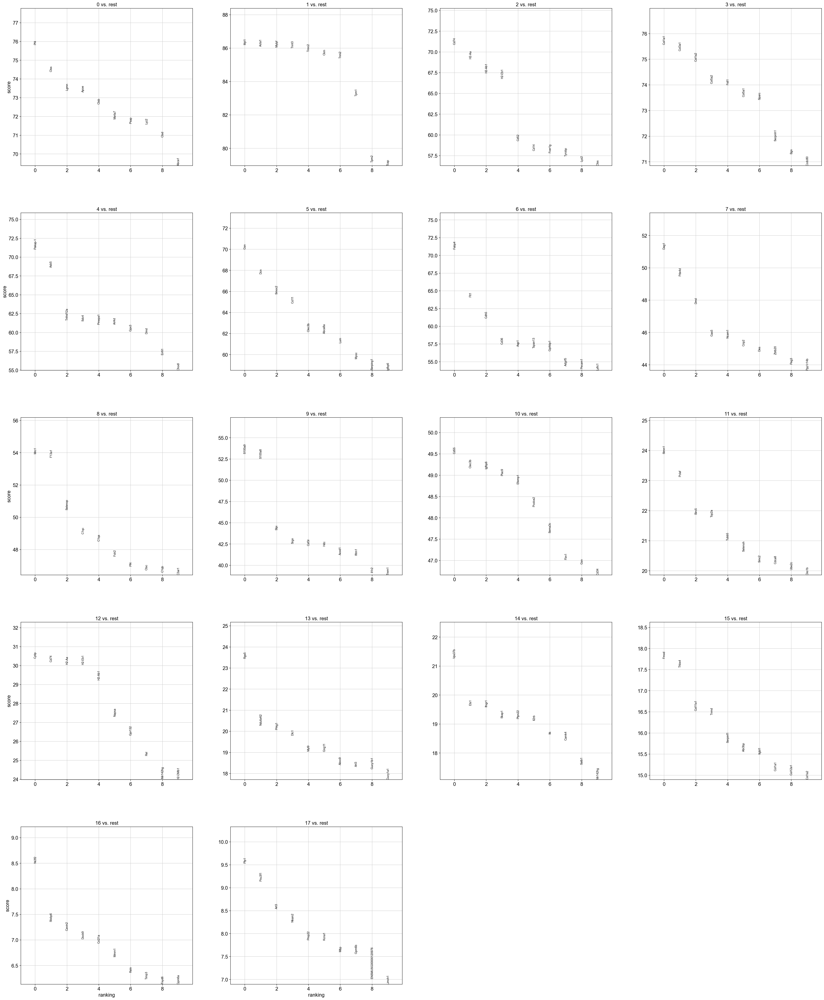

In [58]:
sc.pl.rank_genes_groups(adata_subset, n_genes=10, sharey=False)

categories: Anti-inflammatory Macrophages, Endothelial cells 1, Endothelial cells 2, etc.
var_group_labels: 0, 1, 2, etc.


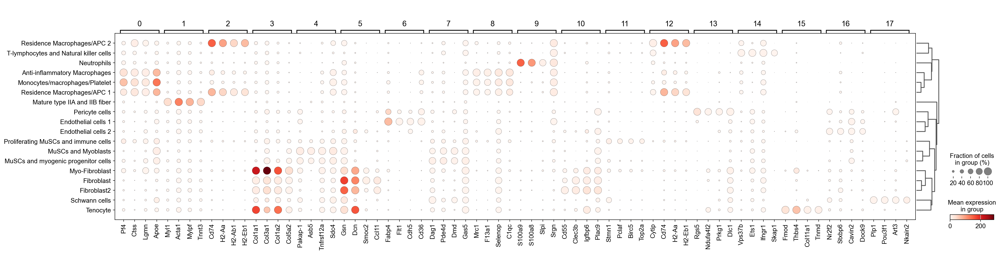

In [59]:
# Visualize marker genes using core dotplot functions
sc.pl.rank_genes_groups_dotplot(adata_subset, groupby='cell_type_str', n_genes=4, save='dotplot2_Mesen.png')


In [60]:
marker_genes_dict = {
    "Monocytes/macrophages/Platelet": ['C1qa', 'Cd14', 'Pf4', 'Lyz2', 'Ms4a7'],
    "Mature type IIA and IIB fiber": ['Myh4', 'Myh2', 'Myh1', 'Acta1'],
    "Residence Macrophages/APC 1": ['Cd74', 'H2-Aa', 'H2-Eb1'],
    "Myo-Fibroblast": ['Cthrc1', 'Col1a1', 'Col3a1'],
    "MuSCs and Myoblasts": ['Myod1', 'Pax7', 'Sdc4'],
    "Fibroblast": ['Pdgfra', 'Gsn', 'Lum'],
    "Endothelial cells 1": ['Pecam1', 'Cldn5', 'Vwf'],
    "Endothelial cells": ['Pecam1', 'Cldn5', 'Vwf'],
    "MuSCs and myogenic progenitor cells": ['Pax7', 'Myf5', 'Myog'],
    "Anti-inflammatory Macrophages": ['Cd163', 'Lyve1', 'Mrc1'],
    "Neutrophils": ['S100a9', 'S100a8', 'Trem1'],
    "Fibroblast2": ['Pdgfra', 'Gsn', 'Lum'],
    "Proliferating MuSCs and immune cells": ['Sparc', 'Cd68', 'Pax7', 'Cenpe'],
    "Residence Macrophages/APC 2": ['Igkc', 'H2-Eb1', 'Cd79a'],
    "Pericyte cells": ['Rgs5', 'Kcnj8', 'Acta2'],
    "T-lymphocytes and Natural killer cells": ['Cd3d', 'Ptprc', 'Nkg7'],
    "Tenocyte": ['Thbs4', 'Fmod', 'Tnmd'],
    "Endothelial cells 2": ['Pecam1', 'Cldn5', 'Vwf'],
    "Schwann cells": ['Plp1', 'Mpz', 'Kcna1']
}

categories: Anti-inflammatory Macrophages, Endothelial cells 1, Endothelial cells 2, etc.
var_group_labels: Monocytes/macrophages/Platelet, Mature type IIA and IIB fiber, Residence Macrophages/APC 1, etc.


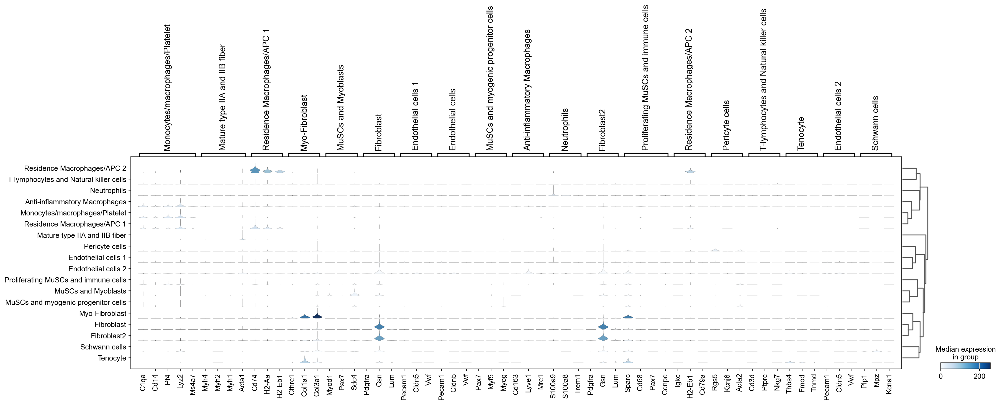

In [61]:
# Stacked violin plot
sc.pl.stacked_violin(adata_subset, marker_genes_dict, groupby='cell_type_str', swap_axes=False, dendrogram=True, save='violin_plot.png')

Subset size: 9142 cells


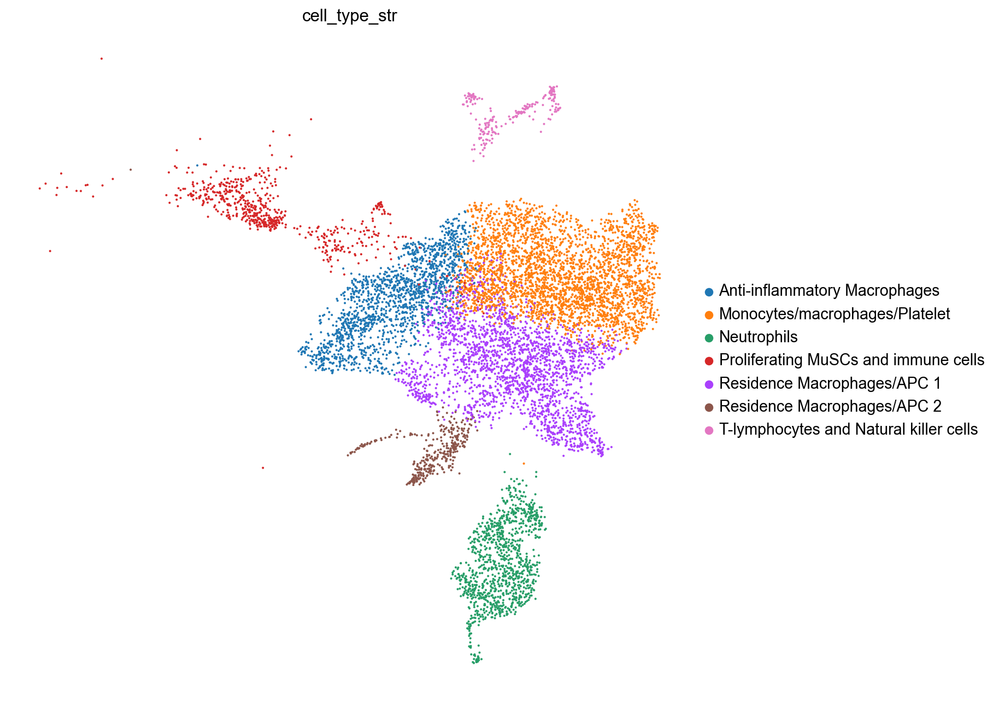

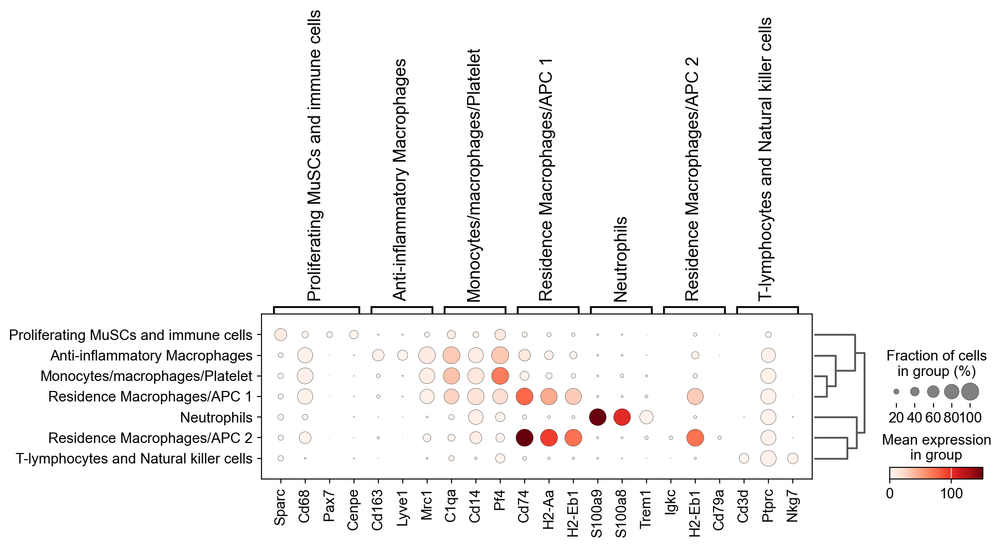

In [62]:
cell_type = {
    "0": "Monocytes/macrophages/Platelet",
    "1": "Mature type IIA and IIB fiber",
    "2": "Residence Macrophages/APC 1",
    "3": "Myo-Fibroblast",
    "4": "MuSCs and Myoblasts",
    "5": "Fibroblast",
    "6": "Endothelial cells 1",
    "7": "MuSCs and myogenic progenitor cells",
    "8": "Anti-inflammatory Macrophages",
    "9": "Neutrophils",
    "10": "Fibroblast2",
    "11": "Proliferating MuSCs and immune cells",
    "12": "Residence Macrophages/APC 2",
    "13": "Pericyte cells",
    "14": "T-lymphocytes and Natural killer cells",
    "15": "Tenocyte",
    "16": "Endothelial cells 2",
    "17": "Schwann cells",
   
}
# Convert 'leiden' values to string cell types
adata.obs['cell_type_str'] = adata.obs['leiden'].astype(str).map(cell_type)

# Define the desired cell types for subsetting
Mesen = [
    "Monocytes/macrophages/Platelet",
    "Residence Macrophages/APC 1",
    "Anti-inflammatory Macrophages",
    "Neutrophils",
    "Proliferating MuSCs and immune cells",
    "Residence Macrophages/APC 2",
    "T-lymphocytes and Natural killer cells",
]

# Filter cells based on the 'cell type' annotation using string values
adata_subset = adata[adata.obs.cell_type_str.isin(Mesen)]

# Print information about the subset size
print(f"Subset size: {len(adata_subset)} cells")

# Check if the subset is not empty before plotting
if len(adata_subset) > 0:
    # Plot UMAP with 'cell type' annotations
    sc.set_figure_params(figsize=(10, 10))
    sc.pl.umap(adata_subset, color=['cell_type_str'], frameon=False, save='umap_plot.png')

    # Plot and save the dot plot
    sc.set_figure_params(figsize=(10, 10))
    marker_genes_dict = {
        "Monocytes/macrophages/Platelet": ['C1qa', 'Cd14', 'Pf4'],
        "Residence Macrophages/APC 1": ['Cd74', 'H2-Aa', 'H2-Eb1'],
        "Anti-inflammatory Macrophages": ['Cd163', 'Lyve1', 'Mrc1'],
        "Neutrophils": ['S100a9', 'S100a8', 'Trem1'],
        "Proliferating MuSCs and immune cells": ['Sparc', 'Cd68', 'Pax7', 'Cenpe'],
        "Residence Macrophages/APC 2": ['Igkc', 'H2-Eb1', 'Cd79a'],
        "T-lymphocytes and Natural killer cells": ['Cd3d', 'Ptprc', 'Nkg7']
       
    }
    
    sc.pl.dotplot(adata_subset, marker_genes_dict, groupby='cell_type_str', dendrogram=True, save='dotplot_Mesen.png')

    # Show the dot plot
    pl.show()
else:
    print("Warning: Subset is empty. No UMAP plot or dot plot generated.")


In [64]:
new_cluster_names = ["Monocytes/macrophages/Platelet", "Mature type IIA and IIB fiber", "Residence Macrophages/APC",
                     "Myo-Fibroblast", "MuSCs and Myoblasts", "Fibroblast", "Endothelial cells 1",
                     "MuSCs and myogenic progenitor cells", "Anti-inflammatory Macrophages", "Neutrophils", "Fibroblast2",
                     "Proliferating immune cells", "Residence Macrophages/APC 2", "Pericyte cells",
                     "T-lymphocytes and Natural killer cells", "Tenocyte", "Endothelial cells 2", "Schwann cells"]

adata.rename_categories('leiden', new_cluster_names)

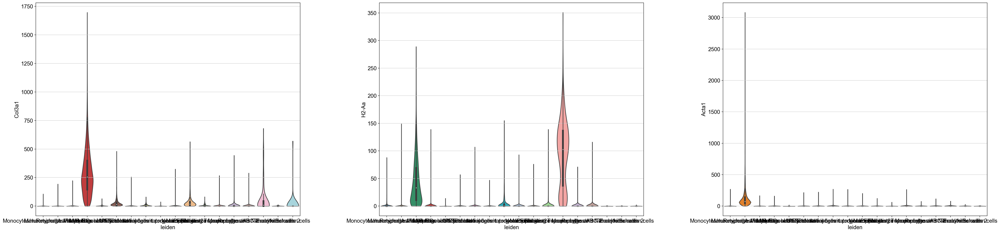

In [66]:
sc.pl.violin(adata, ['Col3a1', 'H2-Aa', 'Acta1'], groupby='leiden', stripplot=False, inner='box', save='violin_plot.png')

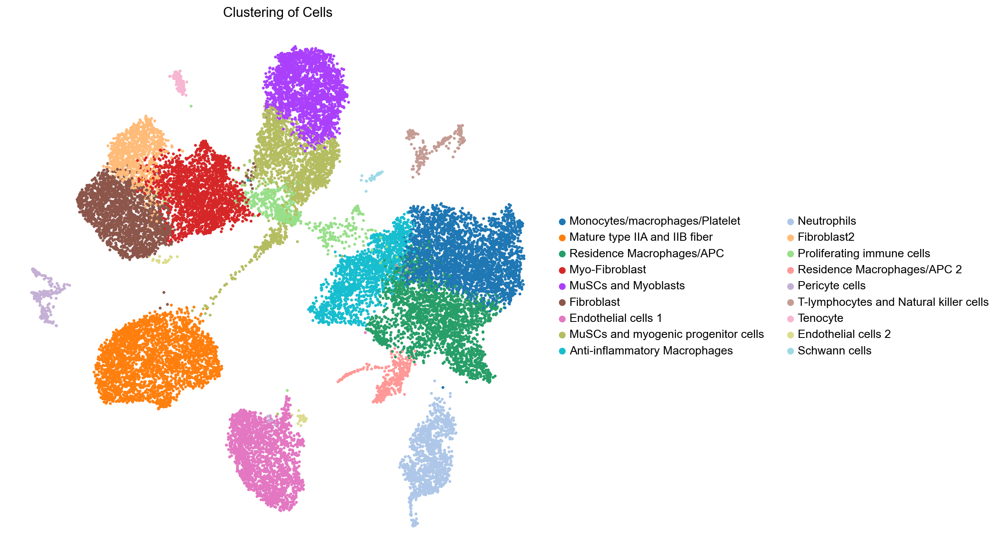

In [67]:
sc.pl.umap(adata, color=['leiden'],  legend_fontsize=12, legend_fontoutline=2, frameon=False, size=35, title='Clustering of Cells', save=f'umap_plot{img_tag}.png')
pl.show()

In [68]:
adata.obs

,Sample,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell type,condition,cell_type_str
AAACCCAGTTCCGTTC-1-Sham_GFP,Sham_GFP,3572,3572,11059.0,432.0,3.906321,Endothelial cells 1,Endothelial cells 1,Sham_GFP,Endothelial cells 1
AAACCCATCCATACTT-1-Sham_GFP,Sham_GFP,2373,2373,7142.0,280.0,3.920470,MuSCs and Myoblasts,MuSCs and Myoblasts,Sham_GFP,MuSCs and Myoblasts
AAACCCATCCCACAGG-1-Sham_GFP,Sham_GFP,2003,2003,5501.0,139.0,2.526813,MuSCs and Myoblasts,MuSCs and Myoblasts,Sham_GFP,MuSCs and Myoblasts
AAACGAACATACCACA-1-Sham_GFP,Sham_GFP,2215,2215,6809.0,175.0,2.570128,MuSCs and Myoblasts,MuSCs and Myoblasts,Sham_GFP,MuSCs and Myoblasts
AAACGAAGTCGTGGTC-1-Sham_GFP,Sham_GFP,2247,2247,6941.0,388.0,5.589973,MuSCs and Myoblasts,MuSCs and Myoblasts,Sham_GFP,MuSCs and Myoblasts
...,...,...,...,...,...,...,...,...,...,...
TTTGTTGAGATGGCGT-1-OV_noGFP,OV_noGFP,1633,1633,3283.0,175.0,5.330490,Monocytes/macrophages/Platelet,Monocytes/macrophages/Platelet,OV_noGFP,Monocytes/macrophages/Platelet
TTTGTTGCACCGAATT-1-OV_noGFP,OV_noGFP,4213,4213,19380.0,352.0,1.816306,Anti-inflammatory Macrophages,Anti-inflammatory Macrophages,OV_noGFP,Anti-inflammatory Macrophages
TTTGTTGCATCCTTCG-1-OV_noGFP,OV_noGFP,2729,2729,8288.0,163.0,1.966699,Monocytes/macrophages/Platelet,Monocytes/macrophages/Platelet,OV_noGFP,Monocytes/macrophages/Platelet
TTTGTTGGTCAGGAGT-1-OV_noGFP,OV_noGFP,1561,1561,3544.0,58.0,1.636569,Residence Macrophages/APC,Residence Macrophages/APC 1,OV_noGFP,Residence Macrophages/APC 1


In [69]:
adata

AnnData object with n_obs × n_vars = 23528 × 24401
    obs: 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell type', 'condition', 'cell_type_str'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'Sample_colors', 'leiden_colors', 'cell type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [68]:
# Subset the data for 'OV_GFP' and 'OV_noGFP' samples
subset_adata = adata[adata.obs['Sample'].isin(['OV_GFP', 'OV_noGFP'])]


In [69]:
# Subset the data for the 'Residence Macrophages/APC 1' cluster
subset_adata = subset_adata[subset_adata.obs['cell type'].isin(['Residence Macrophages/APC 1'])]


In [70]:
subset_adata.obs

,Sample,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell type,condition,cell_type_str
AAACCCACAAGAGGCT-1-OV_GFP,OV_GFP,3691,3691,17983.0,439.0,2.441195,Residence Macrophages/APC,Residence Macrophages/APC 1,OV_GFP,Residence Macrophages/APC 1
AAACGAAGTGGCGTAA-1-OV_GFP,OV_GFP,2845,2845,10127.0,829.0,8.186037,Residence Macrophages/APC,Residence Macrophages/APC 1,OV_GFP,Residence Macrophages/APC 1
AAAGGATTCGCGTTTC-1-OV_GFP,OV_GFP,3337,3337,11660.0,158.0,1.355060,Residence Macrophages/APC,Residence Macrophages/APC 1,OV_GFP,Residence Macrophages/APC 1
AAAGGTAAGCCTTTGA-1-OV_GFP,OV_GFP,2517,2517,8212.0,254.0,3.093035,Residence Macrophages/APC,Residence Macrophages/APC 1,OV_GFP,Residence Macrophages/APC 1
AAAGTCCCAGACACCC-1-OV_GFP,OV_GFP,2879,2879,10789.0,225.0,2.085457,Residence Macrophages/APC,Residence Macrophages/APC 1,OV_GFP,Residence Macrophages/APC 1
...,...,...,...,...,...,...,...,...,...,...
TTTCGATCAGAGGCTA-1-OV_noGFP,OV_noGFP,1963,1963,5396.0,88.0,1.630838,Residence Macrophages/APC,Residence Macrophages/APC 1,OV_noGFP,Residence Macrophages/APC 1
TTTCGATCAGCCTATA-1-OV_noGFP,OV_noGFP,849,849,2059.0,5.0,0.242836,Residence Macrophages/APC,Residence Macrophages/APC 1,OV_noGFP,Residence Macrophages/APC 1
TTTCGATTCTCTTAAC-1-OV_noGFP,OV_noGFP,2475,2475,7237.0,161.0,2.224679,Residence Macrophages/APC,Residence Macrophages/APC 1,OV_noGFP,Residence Macrophages/APC 1
TTTGGAGTCGTTCAGA-1-OV_noGFP,OV_noGFP,1549,1549,3792.0,53.0,1.397679,Residence Macrophages/APC,Residence Macrophages/APC 1,OV_noGFP,Residence Macrophages/APC 1


In [71]:
subset_adata.obs.groupby(['condition', 'Sample']).size()

condition  Sample  
OV_GFP     OV_GFP       655
           OV_noGFP       0
OV_noGFP   OV_GFP         0
           OV_noGFP    1212
dtype: int64

In [76]:
# Example: Create pseudoreplicates


pbs = []
for sample in subset_adata.obs['Sample'].unique():
    samp_cell_subset = subset_adata[subset_adata.obs['Sample'] == sample]

    indices = list(samp_cell_subset.obs_names)
    random.shuffle(indices)
    indices = np.array_split(np.array(indices), 4)  # change number here for the number of replicates desired
    
    for i, pseudo_rep in enumerate(indices):
        rep_adata = sc.AnnData(X=samp_cell_subset[indices[i]].X.sum(axis=0, keepdims=True),
                               var=samp_cell_subset[indices[i]].var[[]])

        rep_adata.obs_names = [sample]
        rep_adata.obs['condition'] = samp_cell_subset.obs['condition'].iloc[0]
        rep_adata.obs['replicate'] = i
        
        pbs.append(rep_adata)

In [77]:
# Combine pseudoreplicates into a single AnnData object
pb = sc.concat(pbs)


In [79]:

# Save counts as a CSV file with sample name
counts = pd.DataFrame(pb.X.T, columns=pb.obs_names, index=pb.var_names)
counts.index.name = 'gene'
counts.to_csv('counts_table.csv')

In [72]:
adata

AnnData object with n_obs × n_vars = 23528 × 24401
    obs: 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell type', 'condition', 'cell_type_str'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'Sample_colors', 'leiden_colors', 'cell type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [73]:
# Subset the data for 'OV_GFP' and 'OV_noGFP' samples
subset_adata = adata[adata.obs['Sample'].isin(['OV_GFP', 'OV_noGFP'])]


In [74]:
# Subset the data for the 'Residence Macrophages/APC 1' cluster
subset_adata = subset_adata[subset_adata.obs['cell type'].isin(['Residence Macrophages/APC 2'])]


In [75]:
subset_adata.obs

,Sample,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell type,condition,cell_type_str
AAGCGTTAGCGGCTCT-1-OV_GFP,OV_GFP,3615,3615,18204.0,168.0,0.922874,Bcells and Residence Macrophages/APC,Residence Macrophages/APC 2,OV_GFP,Residence Macrophages/APC 2
AATAGAGTCCTCTCGA-1-OV_GFP,OV_GFP,4042,4042,16865.0,227.0,1.345983,Bcells and Residence Macrophages/APC,Residence Macrophages/APC 2,OV_GFP,Residence Macrophages/APC 2
ACCATTTGTGTAACGG-1-OV_GFP,OV_GFP,2940,2940,10625.0,109.0,1.025882,Bcells and Residence Macrophages/APC,Residence Macrophages/APC 2,OV_GFP,Residence Macrophages/APC 2
ACGATCAGTCTCAGGC-1-OV_GFP,OV_GFP,2791,2791,11044.0,109.0,0.986961,Bcells and Residence Macrophages/APC,Residence Macrophages/APC 2,OV_GFP,Residence Macrophages/APC 2
ACTTTGTTCTCACTCG-1-OV_GFP,OV_GFP,2883,2883,10142.0,117.0,1.153619,Bcells and Residence Macrophages/APC,Residence Macrophages/APC 2,OV_GFP,Residence Macrophages/APC 2
...,...,...,...,...,...,...,...,...,...,...
TTTACGTGTGACATCT-1-OV_noGFP,OV_noGFP,941,941,1679.0,45.0,2.680167,Bcells and Residence Macrophages/APC,Residence Macrophages/APC 2,OV_noGFP,Residence Macrophages/APC 2
TTTCAGTGTAGGTGCA-1-OV_noGFP,OV_noGFP,2255,2255,6658.0,108.0,1.622109,Bcells and Residence Macrophages/APC,Residence Macrophages/APC 2,OV_noGFP,Residence Macrophages/APC 2
TTTCGATAGCCGTAAG-1-OV_noGFP,OV_noGFP,2506,2506,7289.0,85.0,1.166141,Bcells and Residence Macrophages/APC,Residence Macrophages/APC 2,OV_noGFP,Residence Macrophages/APC 2
TTTGACTTCTTTGCTA-1-OV_noGFP,OV_noGFP,1879,1879,6067.0,67.0,1.104335,Bcells and Residence Macrophages/APC,Residence Macrophages/APC 2,OV_noGFP,Residence Macrophages/APC 2


In [83]:
# Example: Create pseudoreplicates


pbs = []
for sample in subset_adata.obs['Sample'].unique():
    samp_cell_subset = subset_adata[subset_adata.obs['Sample'] == sample]

    indices = list(samp_cell_subset.obs_names)
    random.shuffle(indices)
    indices = np.array_split(np.array(indices), 4)  # change number here for the number of replicates desired
    
    for i, pseudo_rep in enumerate(indices):
        rep_adata = sc.AnnData(X=samp_cell_subset[indices[i]].X.sum(axis=0, keepdims=True),
                               var=samp_cell_subset[indices[i]].var[[]])

        rep_adata.obs_names = [sample]
        rep_adata.obs['condition'] = samp_cell_subset.obs['condition'].iloc[0]
        rep_adata.obs['replicate'] = i
        
        pbs.append(rep_adata)

In [84]:
# Combine pseudoreplicates into a single AnnData object
pb = sc.concat(pbs)


In [85]:

# Save counts as a CSV file with sample name
counts = pd.DataFrame(pb.X.T, columns=pb.obs_names, index=pb.var_names)
counts.index.name = 'gene'
counts.to_csv('counts_table2.csv')

In [88]:
adata

AnnData object with n_obs × n_vars = 23528 × 24401
    obs: 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell type', 'condition', 'cell_type_str'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'Sample_colors', 'leiden_colors', 'cell type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [89]:
# Subset the data for 'OV_GFP' and 'OV_noGFP' samples
subset_adata = adata[adata.obs['Sample'].isin(['Sham_GFP', 'Sham_noGFP'])]
# Subset the data for the 'Residence Macrophages/APC 1' cluster
subset_adata = subset_adata[subset_adata.obs['cell type'].isin(['Endothelial cells 1'])]
subset_adata.obs


,Sample,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell type,condition,cell_type_str
AAACCCAGTTCCGTTC-1-Sham_GFP,Sham_GFP,3572,3572,11059.0,432.0,3.906321,Endothelial cells 1,Endothelial cells 1,Sham_GFP,Endothelial cells 1
AAGCGTTCAAGTGGGT-1-Sham_GFP,Sham_GFP,778,778,1108.0,38.0,3.429603,Endothelial cells 1,Endothelial cells 1,Sham_GFP,Endothelial cells 1
AAGGAATCACGTCTCT-1-Sham_GFP,Sham_GFP,1196,1196,1839.0,56.0,3.045133,Endothelial cells 1,Endothelial cells 1,Sham_GFP,Endothelial cells 1
ACAGGGACACATCCCT-1-Sham_GFP,Sham_GFP,462,462,730.0,29.0,3.972603,Endothelial cells 1,Endothelial cells 1,Sham_GFP,Endothelial cells 1
ACATCGAAGTTACGAA-1-Sham_GFP,Sham_GFP,1121,1121,2493.0,26.0,1.042920,Endothelial cells 1,Endothelial cells 1,Sham_GFP,Endothelial cells 1
...,...,...,...,...,...,...,...,...,...,...
TTTGATCTCAGTCCGG-1-Sham_noGFP,Sham_noGFP,1723,1723,3915.0,132.0,3.371647,Endothelial cells 1,Endothelial cells 1,Sham_noGFP,Endothelial cells 1
TTTGATCTCATCACCC-1-Sham_noGFP,Sham_noGFP,1304,1304,2087.0,54.0,2.587446,Endothelial cells 1,Endothelial cells 1,Sham_noGFP,Endothelial cells 1
TTTGGAGCAAGGTCGA-1-Sham_noGFP,Sham_noGFP,1252,1252,1981.0,79.0,3.987885,Endothelial cells 1,Endothelial cells 1,Sham_noGFP,Endothelial cells 1
TTTGGTTCAGTACTAC-1-Sham_noGFP,Sham_noGFP,1032,1032,1982.0,46.0,2.320888,Endothelial cells 1,Endothelial cells 1,Sham_noGFP,Endothelial cells 1


In [90]:
# Example: Create pseudoreplicates


pbs = []
for sample in subset_adata.obs['Sample'].unique():
    samp_cell_subset = subset_adata[subset_adata.obs['Sample'] == sample]

    indices = list(samp_cell_subset.obs_names)
    random.shuffle(indices)
    indices = np.array_split(np.array(indices), 4)  # change number here for the number of replicates desired
    
    for i, pseudo_rep in enumerate(indices):
        rep_adata = sc.AnnData(X=samp_cell_subset[indices[i]].X.sum(axis=0, keepdims=True),
                               var=samp_cell_subset[indices[i]].var[[]])

        rep_adata.obs_names = [sample]
        rep_adata.obs['condition'] = samp_cell_subset.obs['condition'].iloc[0]
        rep_adata.obs['replicate'] = i
        
        pbs.append(rep_adata)

# Combine pseudoreplicates into a single AnnData object
pb = sc.concat(pbs)
# Save counts as a CSV file with sample name
counts = pd.DataFrame(pb.X.T, columns=pb.obs_names, index=pb.var_names)
counts.index.name = 'gene'
counts.to_csv('counts_tableshamendo.csv')

In [91]:
# Subset the data for 'OV_GFP' and 'OV_noGFP' samples
subset_adata = adata[adata.obs['Sample'].isin(['OV_GFP', 'OV_noGFP'])]


In [92]:
# Subset the data for the 'Residence Macrophages/APC 1' cluster
subset_adata = subset_adata[subset_adata.obs['cell type'].isin(['Proliferating MuSCs and immune cells'])]


In [93]:
# Example: Create pseudoreplicates


pbs = []
for sample in subset_adata.obs['Sample'].unique():
    samp_cell_subset = subset_adata[subset_adata.obs['Sample'] == sample]

    indices = list(samp_cell_subset.obs_names)
    random.shuffle(indices)
    indices = np.array_split(np.array(indices), 4)  # change number here for the number of replicates desired
    
    for i, pseudo_rep in enumerate(indices):
        rep_adata = sc.AnnData(X=samp_cell_subset[indices[i]].X.sum(axis=0, keepdims=True),
                               var=samp_cell_subset[indices[i]].var[[]])

        rep_adata.obs_names = [sample]
        rep_adata.obs['condition'] = samp_cell_subset.obs['condition'].iloc[0]
        rep_adata.obs['replicate'] = i
        
        pbs.append(rep_adata)

# Combine pseudoreplicates into a single AnnData object
pb = sc.concat(pbs)
# Save counts as a CSV file with sample name
counts = pd.DataFrame(pb.X.T, columns=pb.obs_names, index=pb.var_names)
counts.index.name = 'gene'
counts.to_csv('counts_tableproimm.csv')

In [70]:
# Subset the data for 'OV_GFP' and 'OV_noGFP' samples
subset_adata = adata[adata.obs['Sample'].isin(['Sham_GFP', 'Sham_noGFP'])]
# Subset the data for the 'Residence Macrophages/APC 1' cluster
subset_adata = subset_adata[subset_adata.obs['cell type'].isin(['Myo-Fibroblast'])]
subset_adata.obs


,Sample,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell type,condition,cell_type_str
AAAGTCCAGCTCGGCT-1-Sham_GFP,Sham_GFP,5400,5400,23939.0,301.0,1.257362,Myo-Fibroblast,Myo-Fibroblast,Sham_GFP,Myo-Fibroblast
ACAAGCTGTCAGACTT-1-Sham_GFP,Sham_GFP,2565,2565,6719.0,242.0,3.601727,Myo-Fibroblast,Myo-Fibroblast,Sham_GFP,Myo-Fibroblast
ACAGCCGAGGCAGGGA-1-Sham_GFP,Sham_GFP,3839,3839,20266.0,434.0,2.141518,Myo-Fibroblast,Myo-Fibroblast,Sham_GFP,Myo-Fibroblast
ACGGTTATCGCAACAT-1-Sham_GFP,Sham_GFP,3163,3163,9480.0,285.0,3.006329,Myo-Fibroblast,Myo-Fibroblast,Sham_GFP,Myo-Fibroblast
ACGTTCCTCGGTGTTA-1-Sham_GFP,Sham_GFP,3956,3956,17918.0,323.0,1.802657,Myo-Fibroblast,Myo-Fibroblast,Sham_GFP,Myo-Fibroblast
...,...,...,...,...,...,...,...,...,...,...
TTGTTCAAGCCTAACT-1-Sham_noGFP,Sham_noGFP,1670,1670,4379.0,77.0,1.758392,Myo-Fibroblast,Myo-Fibroblast,Sham_noGFP,Myo-Fibroblast
TTGTTTGAGGTACTGG-1-Sham_noGFP,Sham_noGFP,2938,2938,12270.0,385.0,3.137734,Myo-Fibroblast,Myo-Fibroblast,Sham_noGFP,Myo-Fibroblast
TTTACTGGTCTCGACG-1-Sham_noGFP,Sham_noGFP,4051,4051,16057.0,185.0,1.152146,Myo-Fibroblast,Myo-Fibroblast,Sham_noGFP,Myo-Fibroblast
TTTCAGTTCTGATTCT-1-Sham_noGFP,Sham_noGFP,4513,4513,22631.0,257.0,1.135610,Myo-Fibroblast,Myo-Fibroblast,Sham_noGFP,Myo-Fibroblast


In [71]:
# Example: Create pseudoreplicates


pbs = []
for sample in subset_adata.obs['Sample'].unique():
    samp_cell_subset = subset_adata[subset_adata.obs['Sample'] == sample]

    indices = list(samp_cell_subset.obs_names)
    random.shuffle(indices)
    indices = np.array_split(np.array(indices), 4)  # change number here for the number of replicates desired
    
    for i, pseudo_rep in enumerate(indices):
        rep_adata = sc.AnnData(X=samp_cell_subset[indices[i]].X.sum(axis=0, keepdims=True),
                               var=samp_cell_subset[indices[i]].var[[]])

        rep_adata.obs_names = [sample]
        rep_adata.obs['condition'] = samp_cell_subset.obs['condition'].iloc[0]
        rep_adata.obs['replicate'] = i
        
        pbs.append(rep_adata)

# Combine pseudoreplicates into a single AnnData object
pb = sc.concat(pbs)
# Save counts as a CSV file with sample name
counts = pd.DataFrame(pb.X.T, columns=pb.obs_names, index=pb.var_names)
counts.index.name = 'gene'
counts.to_csv('counts_tableMyo-Fibroblast.csv')

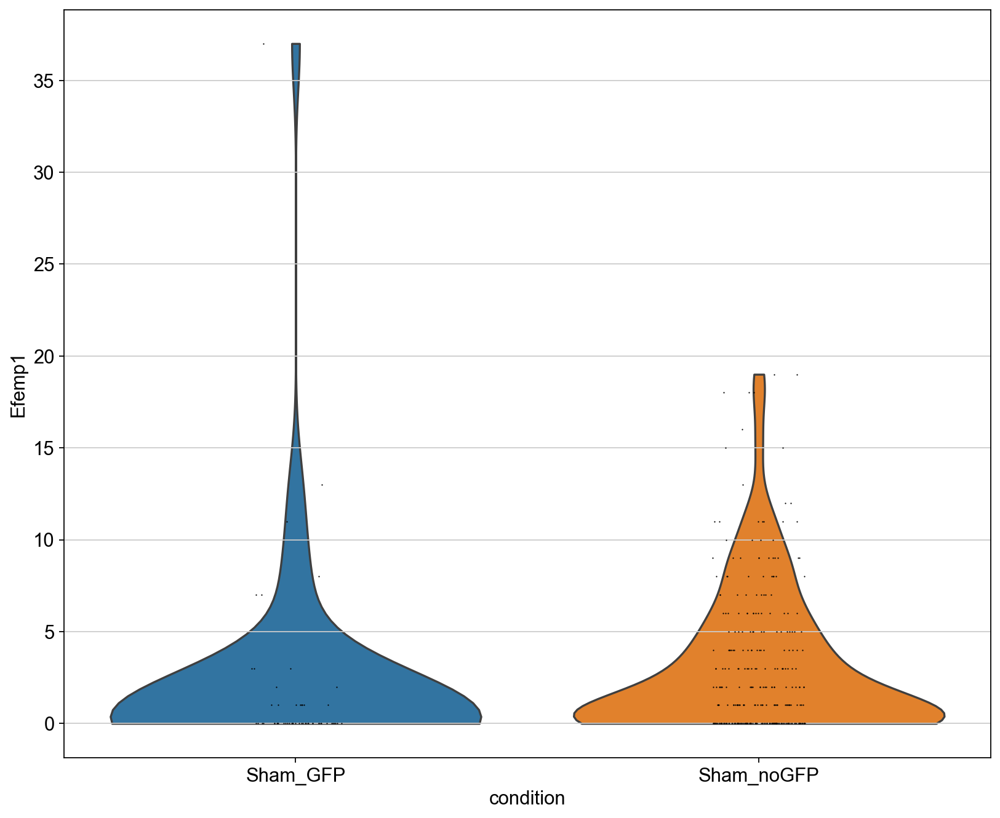

In [74]:
sc.pl.violin(subset_adata[subset_adata.obs['cell type'] == 'Myo-Fibroblast'], 'Efemp1', groupby='condition')

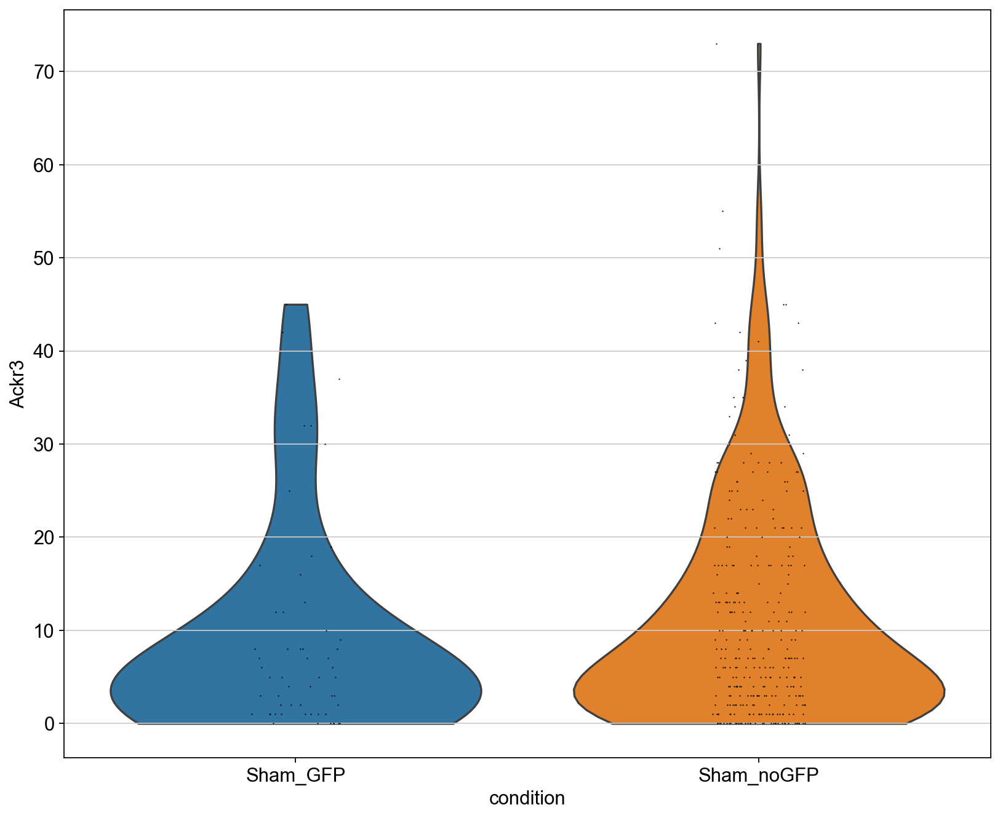

In [77]:
sc.pl.violin(subset_adata[subset_adata.obs['cell type'] == 'Myo-Fibroblast'], 'Ackr3', groupby='condition')

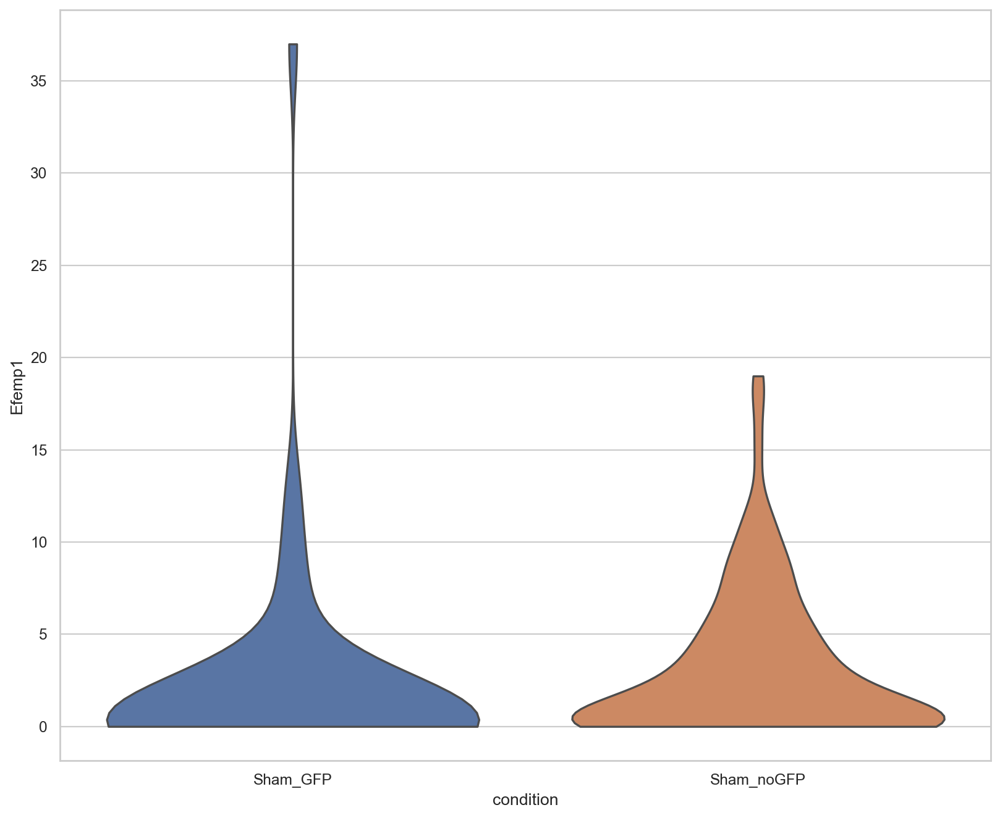

In [84]:
# Set Seaborn style
sns.set(style="whitegrid")

# Assuming subset_adata is your AnnData object
sc.pl.violin(subset_adata[subset_adata.obs['cell type'] == 'Myo-Fibroblast'], 'Efemp1', groupby='condition', stripplot=False)



In [90]:
from scipy import stats

In [95]:
# Assuming subset_adata is your AnnData object
temp = subset_adata[subset_adata.obs['cell type'] == 'Myo-Fibroblast']

# Find the index of 'Efemp1' in the var_names
i = np.where(temp.var_names == 'Efemp1')[0][0]

In [96]:
a = temp[temp.obs.condition == 'Sham_GFP'].X[:,i]
b = temp[temp.obs.condition == 'Sham_noGFP'].X[:,i]

In [97]:
stats.mannwhitneyu(a, b)

MannwhitneyuResult(statistic=5515.5, pvalue=7.409813506524722e-06)

Subset size: 629 cells


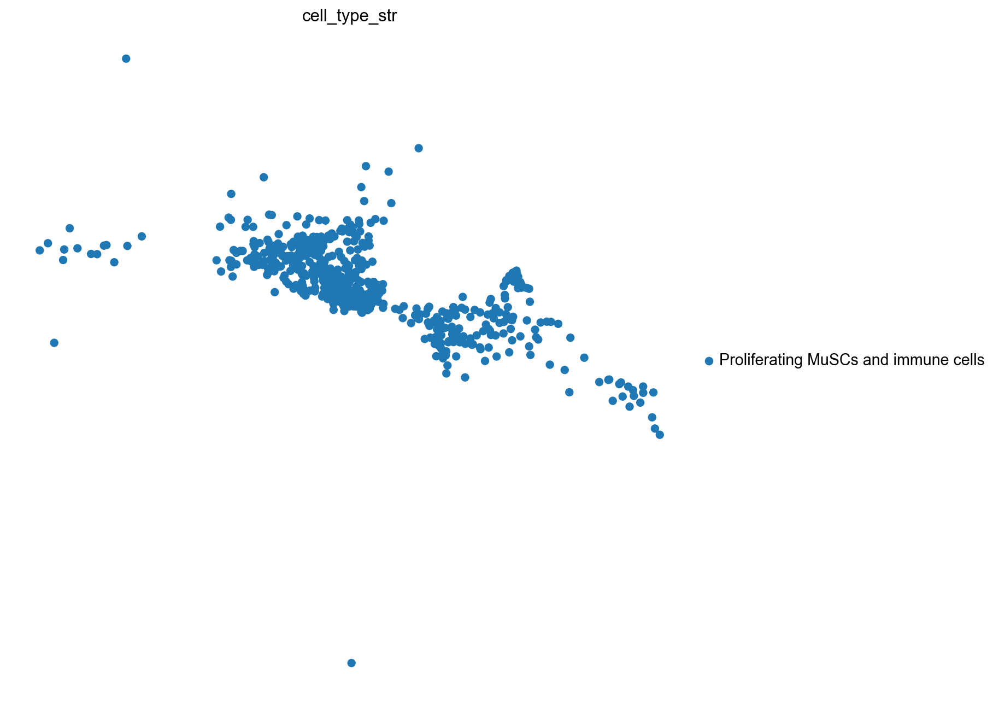

In [47]:
cell_type = {
    "0": "Monocytes/macrophages/Platelet",
    "1": "Mature type IIA and IIB fiber",
    "2": "Residence Macrophages/APC 1",
    "3": "Myo-Fibroblast",
    "4": "MuSCs and Myoblasts",
    "5": "Fibroblast",
    "6": "Endothelial cells 1",
    "7": "MuSCs and myogenic progenitor cells",
    "8": "Anti-inflammatory Macrophages",
    "9": "Neutrophils",
    "10": "Fibroblast2",
    "11": "Proliferating MuSCs and immune cells",
    "12": "Residence Macrophages/APC 2",
    "13": "Pericyte cells",
    "14": "T-lymphocytes and Natural killer cells",
    "15": "Tenocyte",
    "16": "Endothelial cells 2",
    "17": "Schwann cells",
   
}
# Convert 'leiden' values to string cell types
adata.obs['cell_type_str'] = adata.obs['leiden'].astype(str).map(cell_type)

# Define the desired cell types for subsetting
Mesen = [
    
    "Proliferating MuSCs and immune cells",
   
]

# Filter cells based on the 'cell type' annotation using string values
adata_subset = adata[adata.obs.cell_type_str.isin(Mesen)]

# Print information about the subset size
print(f"Subset size: {len(adata_subset)} cells")

# Check if the subset is not empty before plotting
if len(adata_subset) > 0:
    # Plot UMAP with 'cell type' annotations
    sc.set_figure_params(figsize=(10, 10))
    sc.pl.umap(adata_subset, color=['cell_type_str'], frameon=False, save='umap_plot.png')


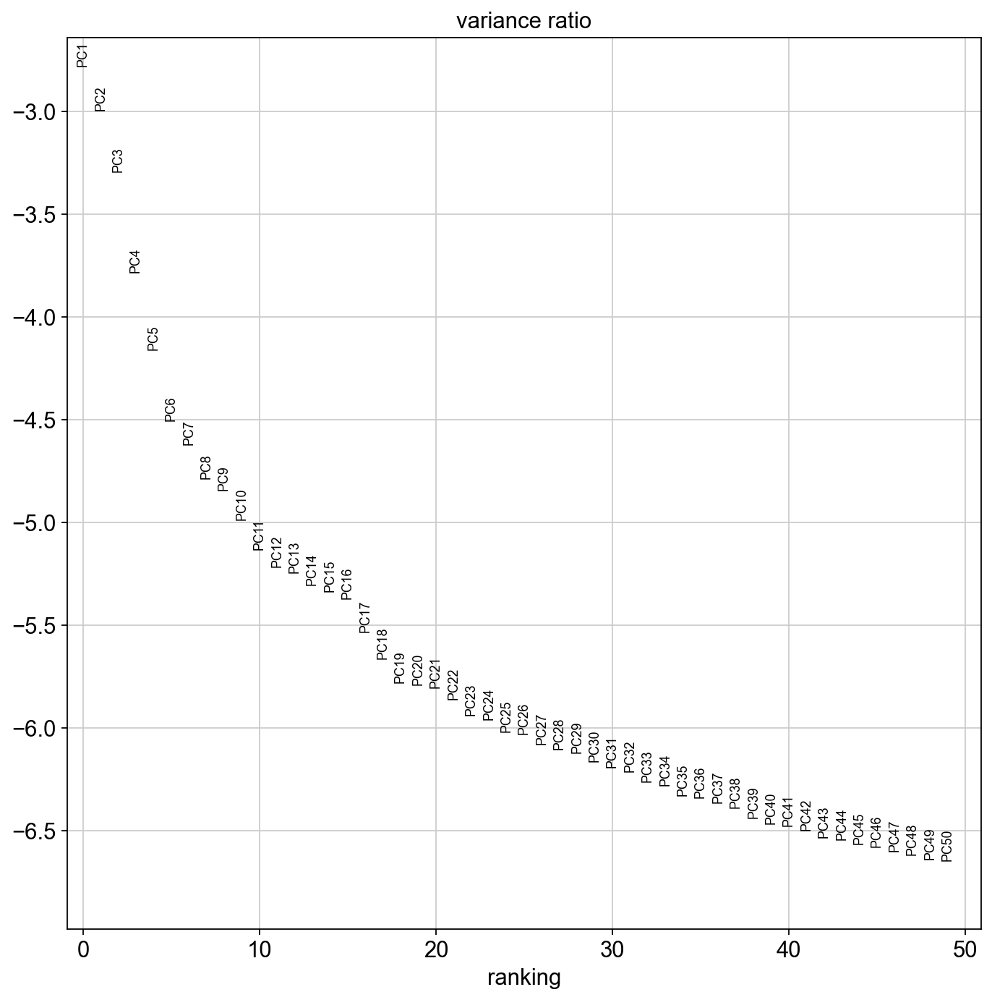

In [48]:
sc.pl.pca_variance_ratio(adata_subset, log=True, n_pcs=50)


In [49]:
sc.pp.neighbors(adata_subset, n_pcs=15)
sc.tl.umap(adata_subset)
sc.tl.leiden(adata_subset, resolution = 0.3)


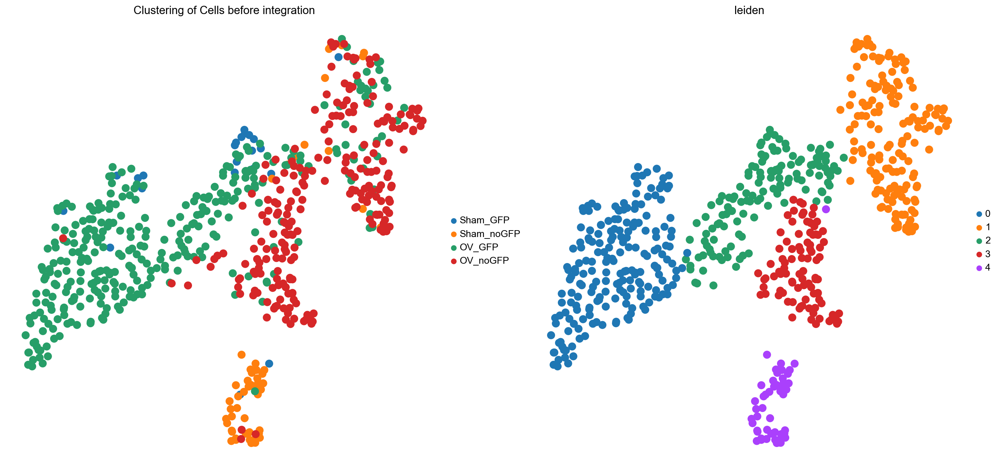

In [50]:
# Customize UMAP plot
sc.set_figure_params(figsize=(10, 10))
img_tag = "_color"  # Specify your image tag here
sc.pl.umap(adata_subset, color=['Sample', 'leiden'], legend_fontsize=12, legend_fontoutline=2, frameon=False, size=400, title='Clustering of Cells before integration', save=f'umap_plot{img_tag}.png')

In [89]:
cell_type = {
    "0": "Myogenic cells",
    "1": "Infiltrating macrophages",
    "2": "Unclassified",
    "3": "Myo-Fibroblast",
    "4": "Fibroblast"   
}


In [90]:
adata_subset.obs.leiden.map(cell_type)
adata_subset.obs['cell type'] = adata_subset.obs.leiden.map(cell_type)

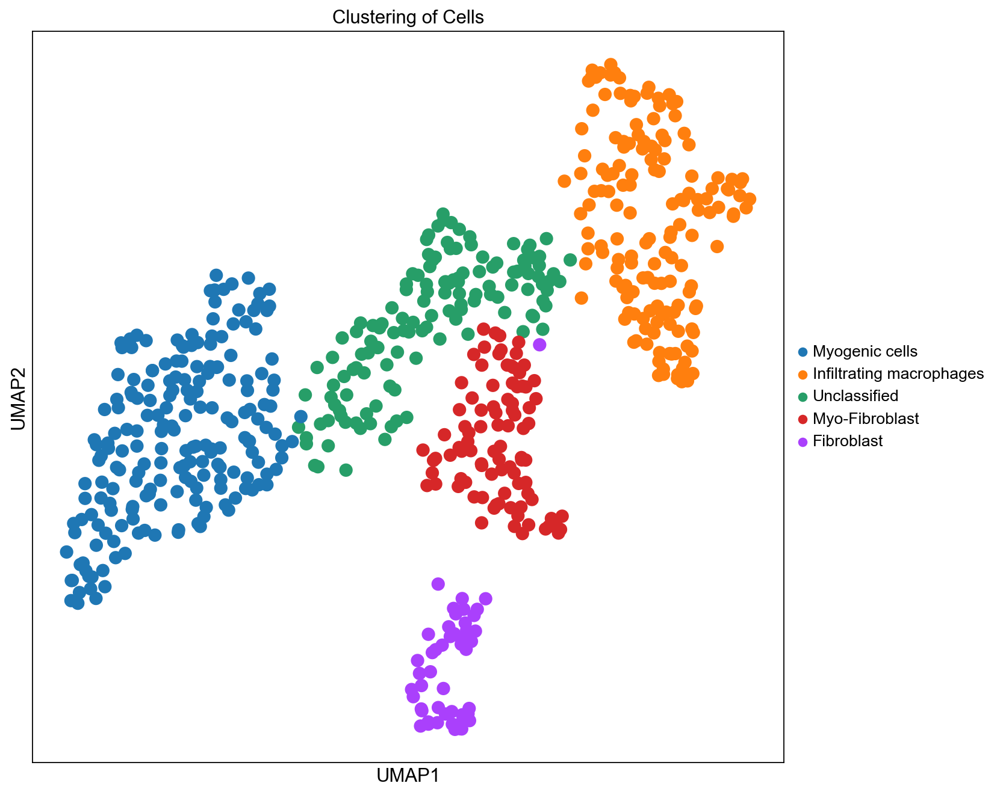

In [91]:


# Customize UMAP plot
sc.set_figure_params(figsize=(10, 10))
img_tag = "_color"  # Specify your image tag here
sc.pl.umap(adata_subset, color=['cell type'],  legend_fontsize=12, legend_fontoutline=2, frameon=True, size=400, title='Clustering of Cells', save=f'umap_plot{img_tag}.png')
pl.show()

In [99]:
adata_subset.obs['Sample'].unique().tolist()
def map_condition(x):
    if 'Sham_GFP' in x:
        return 'Sham_GFP'
    elif 'Sham_noGFP' in x:
        return 'Sham_noGFP'
    elif 'OV_GFP' in x:
        return 'OV_GFP'
    else:
        return 'OV_noGFP'

adata_subset.obs['condition'] = adata_subset.obs.Sample.map(map_condition)
adata_subset.obs



,Sample,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell_type_str,cell type,condition
AAACGCTAGGTGAGCT-1-Sham_GFP,Sham_GFP,510,510,1070.0,0.0,0.000000,2,Proliferating MuSCs and immune cells,Unclassified,Sham_GFP
ACCCTTGCAATCTCTT-1-Sham_GFP,Sham_GFP,698,698,11012.0,38.0,0.345078,2,Proliferating MuSCs and immune cells,Unclassified,Sham_GFP
ACCTACCGTGACTCGC-1-Sham_GFP,Sham_GFP,3375,3375,10089.0,445.0,4.410745,0,Proliferating MuSCs and immune cells,Myogenic cells,Sham_GFP
ACTATTCTCTCGCAGG-1-Sham_GFP,Sham_GFP,568,568,1215.0,134.0,11.028807,2,Proliferating MuSCs and immune cells,Unclassified,Sham_GFP
AGATCCAAGATCCGAG-1-Sham_GFP,Sham_GFP,339,339,657.0,8.0,1.217656,2,Proliferating MuSCs and immune cells,Unclassified,Sham_GFP
...,...,...,...,...,...,...,...,...,...,...
TTTCACAAGTCATAGA-1-OV_noGFP,OV_noGFP,3368,3368,10733.0,177.0,1.649119,1,Proliferating MuSCs and immune cells,Infiltrating macrophages,OV_noGFP
TTTCACAGTATGTCAC-1-OV_noGFP,OV_noGFP,5324,5324,27831.0,248.0,0.891093,1,Proliferating MuSCs and immune cells,Infiltrating macrophages,OV_noGFP
TTTCACATCGCGCCAA-1-OV_noGFP,OV_noGFP,1786,1786,3348.0,301.0,8.990442,1,Proliferating MuSCs and immune cells,Infiltrating macrophages,OV_noGFP
TTTCATGCACGACCTG-1-OV_noGFP,OV_noGFP,3773,3773,11545.0,322.0,2.789086,1,Proliferating MuSCs and immune cells,Infiltrating macrophages,OV_noGFP


In [100]:
adata_subset.obs.groupby(['Sample']).count()
num_tot_cells = adata_subset.obs.groupby(['Sample']).count()
num_tot_cells = dict(zip(num_tot_cells.index, num_tot_cells.n_genes))
num_tot_cells


{'Sham_GFP': 22, 'Sham_noGFP': 55, 'OV_GFP': 326, 'OV_noGFP': 226}

In [101]:
cell_type_counts = adata_subset.obs.groupby(['Sample', 'condition', 'cell type']).count()
cell_type_counts = cell_type_counts[cell_type_counts.sum(axis = 1) > 0].reset_index()



In [102]:
cell_type_counts
cell_type_counts['total_cells'] = cell_type_counts.Sample.map(num_tot_cells).astype(int)

cell_type_counts['frequency'] = cell_type_counts.n_genes / cell_type_counts.total_cells

cell_type_counts





,Sample,condition,cell type,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell_type_str,total_cells,frequency
0,Sham_GFP,Sham_GFP,Myogenic cells,6,6,6,6,6,6,6,22,0.272727
1,Sham_GFP,Sham_GFP,Infiltrating macrophages,1,1,1,1,1,1,1,22,0.045455
2,Sham_GFP,Sham_GFP,Unclassified,13,13,13,13,13,13,13,22,0.590909
3,Sham_GFP,Sham_GFP,Fibroblast,2,2,2,2,2,2,2,22,0.090909
4,Sham_noGFP,Sham_noGFP,Infiltrating macrophages,9,9,9,9,9,9,9,55,0.163636
5,Sham_noGFP,Sham_noGFP,Unclassified,4,4,4,4,4,4,4,55,0.072727
6,Sham_noGFP,Sham_noGFP,Fibroblast,42,42,42,42,42,42,42,55,0.763636
7,OV_GFP,OV_GFP,Myogenic cells,191,191,191,191,191,191,191,326,0.585890
8,OV_GFP,OV_GFP,Infiltrating macrophages,37,37,37,37,37,37,37,326,0.113497
9,OV_GFP,OV_GFP,Unclassified,86,86,86,86,86,86,86,326,0.263804


<Figure size 960x640 with 0 Axes>

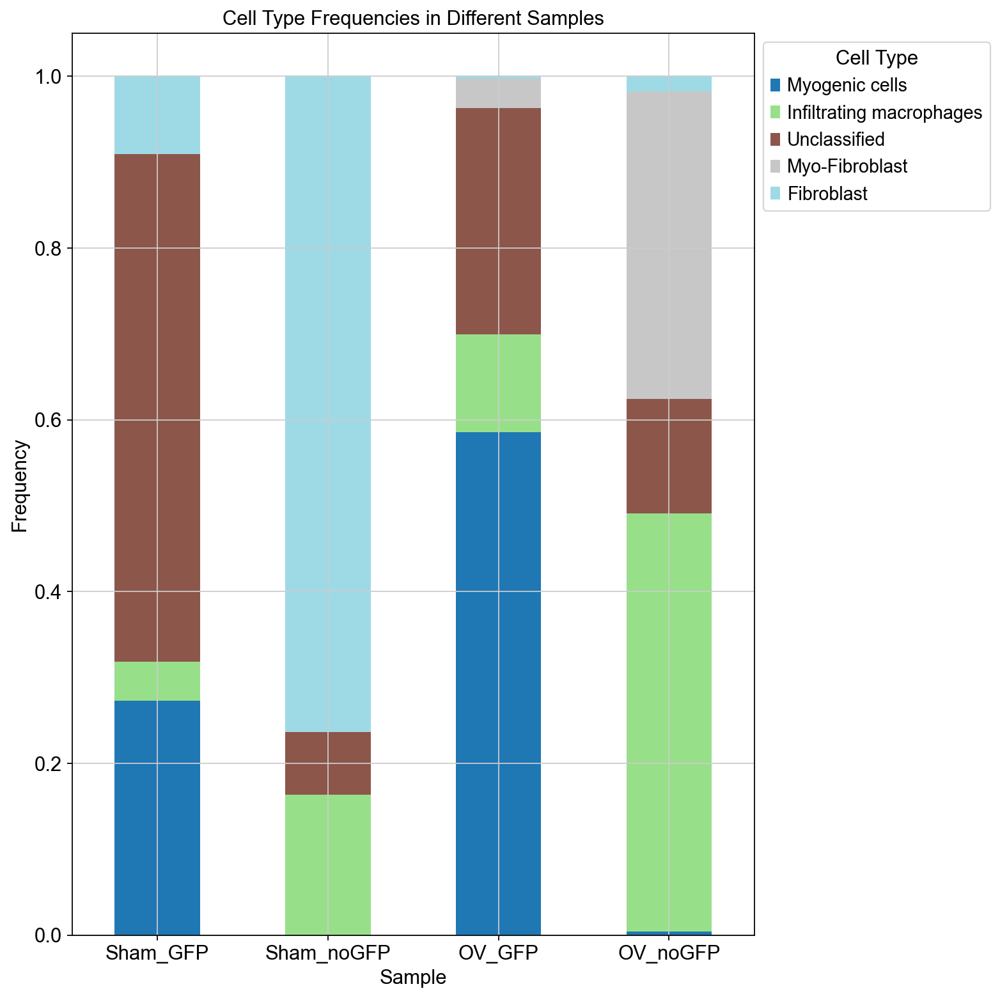

In [103]:
# Filter cell_type_counts to include only relevant columns
cell_type_counts = cell_type_counts[['Sample', 'condition', 'cell type', 'frequency']]

# Set the figure size
pl.figure(figsize=(12, 8))

# Define the order of samples in the plot
sample_order = ['Sham_GFP', 'Sham_noGFP', 'OV_GFP', 'OV_noGFP']

# Filter data for the specified samples
filtered_data = cell_type_counts[cell_type_counts['condition'].isin(sample_order)]

# Pivot the DataFrame for a stacked bar plot
stacked_data = filtered_data.pivot_table(index='condition', columns='cell type', values='frequency', fill_value=0)

# Create a stacked bar plot with distinct colors for each cell type
stacked_data.plot(kind='bar', stacked=True, colormap='tab20')

# Set plot properties
pl.xticks(rotation=0)  # Keep the x-axis labels horizontal
pl.xlabel('Sample')
pl.ylabel('Frequency')
pl.legend(title='Cell Type', bbox_to_anchor=(1, 1))  # Move the legend outside the plot area
pl.title('Cell Type Frequencies in Different Samples')
pl.tight_layout()
pl.savefig('bar4_plot.png')
# Show the plot
pl.show()

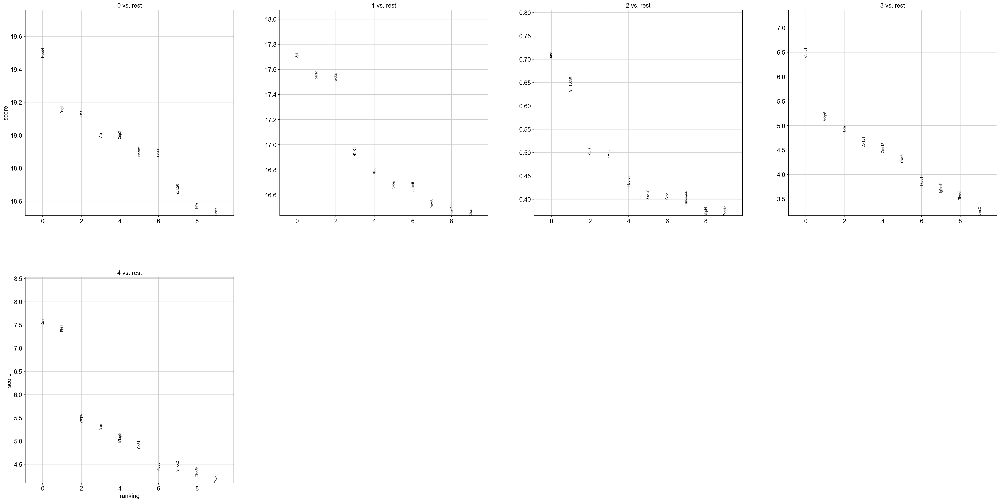

In [104]:
sc.pp.log1p(adata_subset)
sc.tl.rank_genes_groups(adata_subset, 'leiden', method='wilcoxon')

adata_subset.uns ['rank_genes_groups']

sc.pl.rank_genes_groups(adata_subset, n_genes=10, sharey=False)



categories: Myogenic cells, Infiltrating macrophages, Unclassified, etc.
var_group_labels: 0, 1, 2, etc.


KeyError: "['MuScs and progenitor', 'Infiltrating immune cells'] not in index"

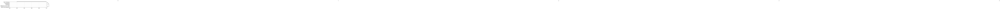

In [105]:
# Visualize marker genes using core dotplot functions
sc.pl.rank_genes_groups_dotplot(adata_subset, groupby='cell type', n_genes=6, save='dotplot2_Mesen.png')


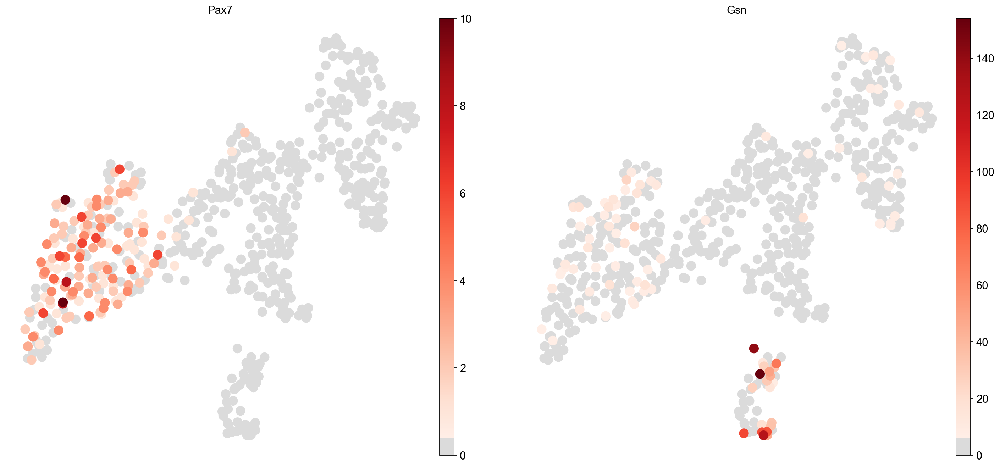

In [571]:
sc.pl.umap(adata_subset, color=["Pax7", "Gsn"],  legend_fontsize=12, legend_fontoutline=12,
           frameon=False, size=600,cmap=newcmp, use_raw=True, save=f'umap_plot{img_tag}.png')
# Show the UMAP plot
pl.show()


In [ ]:
#cell_type = {"0":"Fibroblast Pdgfra, Gsn, Lum, Col6a2 ",
"1":" MuSCs and Myoblasts Myod1, Pax7, Sdc4, Vcam1,  Myf5",
"2":"Endothelial cells Pecam1, Cldn5, Vwf, Emcn, Flt1, Flt4 Egfl7"
"3":"Anti-inflammatory Macrophages/Monocyte cells  C1qa, Apoe, Cd14, Aif1 "
"4":"Monocytes/macrophages/Platelet Cd68, Pf4, Cd38,Ms4a7, Cd86, Lyz2, Cd14, Cfp",     Mrc1(7)
"5":"Type IIB fiber Myh4, Actn3 Myh1, Acta1,Tnnc2",
"6":"Type IIA fiber Myh2, Myh1, Acta1, Tnnc2, Actn3",
"7":"Neutrophils S100a9, S100a8, Ly6g, Trem1",
"8":"Activated MuSCs and myogenic progenitor cells Pax7 Vcam1, Myf5, Myog",
"9":"M2 Macrophages Cd163, Lyve1, Mrc1, Folr2, Fcna, Egr2", Bank1, Cd33
"10":"Proinflamatory Macrophage/Monocyte cells  Ccl6 Cd14, Ccr2, Cd80 Il1b, Mefv",
"11":"Residence M1 Macrophages/APC Cd74, H2-Ab1, H2-Aa, H2-Eb1, H2-DMb1, Cd80, Cd86, Cd40, Tpm3,Myl6", 
"12":"Proliferating immune cells Cenpe, Cenpe, Top2a, Tk1, Tyms, Ube2c Birc5, Stmn1",
"13":"B- and T-lymphocytes and Natural killer cells Cd3d, Cd3e, Ptprc, Nkg7, Tbx21, Ccl5, Skap1 Cd3e, Ikzf1, Il7r, Il2rb,Gata3 ",
"14":"Proliferating macropgages Top2a, Birc5 Pparg, Stmn1, Myo1f, Mpl
"15":"Pericyte cells Rgs5,Kcnj8, Acta2, Mcam, Notch3, Pdgfrb, Cspg4",
"16":"Myo-Fibroblast Cthrc1, Col1a1 Col3a1,",
"17":"Tenocyte Mkx, Fmod, Tnmd, Scx, Pdgfrb,",
"18":"Bcells Igkc, Ly6d, Cd79a, Cd79b, Pax5, Ighm, Bank1",
"19":"Schwann cell Cdh19, Mpz, Kcna1",
"20":"Endothelial cells Pecam1, Cldn5, Vwf, Flt4 Egfl7" Lyve1

#}

In [68]:
cell_subset = adata[adata.obs['cell type'] == 'Residence Macrophages/APC 1']
cell_subset

View of AnnData object with n_obs × n_vars = 2238 × 24401
    obs: 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell type', 'condition', 'cell_type_str'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'Sample_colors', 'cell type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [69]:
adata.obs

,Sample,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell type,condition,cell_type_str
AAACCCAGTTCCGTTC-1-Sham_GFP,Sham_GFP,3572,3572,11059.0,432.0,3.906321,Endothelial cells 1,Endothelial cells 1,Sham_GFP,Endothelial cells 1
AAACCCATCCATACTT-1-Sham_GFP,Sham_GFP,2373,2373,7142.0,280.0,3.920470,MuSCs and Myoblasts,MuSCs and Myoblasts,Sham_GFP,MuSCs and Myoblasts
AAACCCATCCCACAGG-1-Sham_GFP,Sham_GFP,2003,2003,5501.0,139.0,2.526813,MuSCs and Myoblasts,MuSCs and Myoblasts,Sham_GFP,MuSCs and Myoblasts
AAACGAACATACCACA-1-Sham_GFP,Sham_GFP,2215,2215,6809.0,175.0,2.570128,MuSCs and Myoblasts,MuSCs and Myoblasts,Sham_GFP,MuSCs and Myoblasts
AAACGAAGTCGTGGTC-1-Sham_GFP,Sham_GFP,2247,2247,6941.0,388.0,5.589973,MuSCs and Myoblasts,MuSCs and Myoblasts,Sham_GFP,MuSCs and Myoblasts
...,...,...,...,...,...,...,...,...,...,...
TTTGTTGAGATGGCGT-1-OV_noGFP,OV_noGFP,1633,1633,3283.0,175.0,5.330490,Monocytes/macrophages/Platelet,Monocytes/macrophages/Platelet,OV_noGFP,Monocytes/macrophages/Platelet
TTTGTTGCACCGAATT-1-OV_noGFP,OV_noGFP,4213,4213,19380.0,352.0,1.816306,Anti-inflammatory Macrophages,Anti-inflammatory Macrophages,OV_noGFP,Anti-inflammatory Macrophages
TTTGTTGCATCCTTCG-1-OV_noGFP,OV_noGFP,2729,2729,8288.0,163.0,1.966699,Monocytes/macrophages/Platelet,Monocytes/macrophages/Platelet,OV_noGFP,Monocytes/macrophages/Platelet
TTTGTTGGTCAGGAGT-1-OV_noGFP,OV_noGFP,1561,1561,3544.0,58.0,1.636569,Residence Macrophages/APC,Residence Macrophages/APC 1,OV_noGFP,Residence Macrophages/APC 1


In [ ]:
raw_counts = adata.X

In [ ]:
adata.X

In [70]:
cell_subset.obs.groupby(['condition', 'Sample']).size()

condition   Sample    
Sham_GFP    Sham_GFP        26
            Sham_noGFP       0
            OV_GFP           0
            OV_noGFP         0
Sham_noGFP  Sham_GFP         0
            Sham_noGFP     345
            OV_GFP           0
            OV_noGFP         0
OV_GFP      Sham_GFP         0
            Sham_noGFP       0
            OV_GFP         655
            OV_noGFP         0
OV_noGFP    Sham_GFP         0
            Sham_noGFP       0
            OV_GFP           0
            OV_noGFP      1212
dtype: int64

In [71]:
pbs = []
for sample in cell_subset.obs['Sample'].unique():
    samp_cell_subset = cell_subset[cell_subset.obs['Sample'] == sample]
    
    indices = list(samp_cell_subset.obs_names)
    random.shuffle(indices)
    indices = np.array_split(np.array(indices), 4)  # change number here for the number of replicates desired
    
    for i, pseudo_rep in enumerate(indices):
        rep_adata = sc.AnnData(X=samp_cell_subset[indices[i]].X.sum(axis=0, keepdims=True),
                               var=samp_cell_subset[indices[i]].var[[]])

        rep_adata.obs_names = [sample]
        rep_adata.obs['condition'] = samp_cell_subset.obs['condition'].iloc[0]
        rep_adata.obs['replicate'] = i
        
        pbs.append(rep_adata)

In [72]:
pb = sc.concat(pbs)

In [75]:
pb.obs

,condition,replicate
Sham_GFP,Sham_GFP,0
Sham_GFP,Sham_GFP,1
Sham_GFP,Sham_GFP,2
Sham_GFP,Sham_GFP,3
Sham_noGFP,Sham_noGFP,0
Sham_noGFP,Sham_noGFP,1
Sham_noGFP,Sham_noGFP,2
Sham_noGFP,Sham_noGFP,3
OV_GFP,OV_GFP,0
OV_GFP,OV_GFP,1


In [78]:
# Save counts as a CSV file with sample name
counts = pd.DataFrame(pb.X.T, columns=pb.obs_names, index=pb.var_names)
counts.index.name = 'gene'
counts.to_csv('counts_table.csv')

In [ ]:
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

In [ ]:
counts = pd.DataFrame(pb.X, columns = pb.var_names) #need to do this to pass var names

In [ ]:
counts

In [100]:
pbs = []

# Loop over unique samples
for sample in cell_subset.obs['Sample'].unique():
    # Subset the data for each sample
    samp_cell_subset = cell_subset[cell_subset.obs['Sample'] == sample]

    # Shuffle and split indices
    indices = list(samp_cell_subset.obs_names)
    random.shuffle(indices)
    indices = np.array_split(np.array(indices), 4)  # Adjust the number for the desired replicates

    # Loop over pseudo-replicates and create AnnData objects
    for i, pseudo_rep in enumerate(indices):
        # Create AnnData object for the pseudo-replicate
        rep_adata = sc.AnnData(X=samp_cell_subset[pseudo_rep].X.sum(axis=0, keepdims=True),
                               var=samp_cell_subset.var[[]])  # Use .var_names directly

        # Assign metadata information
        rep_adata.obs_names = [sample]
        rep_adata.obs['condition'] = samp_cell_subset.obs['condition'].iloc[0]
        rep_adata.obs['replicate'] = i

        # Append the pseudo-replicate AnnData to the list
        pbs.append(rep_adata)

# Now 'pbs' contains the list of pseudo-replicate AnnData objects

# If you want to concatenate all pseudo-replicates into a single AnnData object:
all_pseudo_reps = sc.AnnData.concatenate(*pbs, join='outer')

# If you want to extract the counts data as a DataFrame:
counts_data = pd.DataFrame(all_pseudo_reps.X, columns=all_pseudo_reps.var_names)
# Note: You might need to adjust the index based on your data structure
counts_data.index = all_pseudo_reps.obs_names

In [79]:
pb.obs

,condition,replicate
Sham_GFP,Sham_GFP,0
Sham_GFP,Sham_GFP,1
Sham_GFP,Sham_GFP,2
Sham_GFP,Sham_GFP,3
Sham_noGFP,Sham_noGFP,0
Sham_noGFP,Sham_noGFP,1
Sham_noGFP,Sham_noGFP,2
Sham_noGFP,Sham_noGFP,3
OV_GFP,OV_GFP,0
OV_GFP,OV_GFP,1


In [80]:
counts = counts[counts.sum(axis = 1) > 0]
counts

,Sham_GFP,Sham_GFP,Sham_GFP,Sham_GFP,Sham_noGFP,Sham_noGFP,Sham_noGFP,Sham_noGFP,OV_GFP,OV_GFP,OV_GFP,OV_GFP,OV_noGFP,OV_noGFP,OV_noGFP,OV_noGFP
gene,,,,,,,,,,,,,,,,
Lypla1,-2.744406,0.973714,-0.813958,-0.462153,-5.572218,-13.560760,10.740902,-4.609385,-4.481880,9.378718,19.808844,4.658380,-22.276844,-9.210477,26.824938,0.827558
Atp6v1h,0.187678,4.830680,10.113243,6.413668,27.955416,60.761868,27.509468,36.350197,126.726685,97.077843,112.332535,124.882202,96.757195,114.093018,173.717422,120.448814
4732440D04Rik,-1.843387,-0.361487,0.946944,-1.580046,4.988849,7.803699,4.297129,-1.219975,7.850019,-6.164989,-10.443756,-6.920425,3.310668,10.132246,-6.083541,16.185463
St18,-2.261046,-2.261046,1.237027,0.400305,-1.247282,-5.601427,-4.830464,-17.919708,126.429329,162.005859,124.959137,123.751442,151.124985,134.122513,141.007706,146.659470
Sntg1,-0.578334,8.510436,-0.495715,-0.495715,2.894759,5.839276,-3.372049,8.878295,12.015812,3.657255,-7.256996,-7.298750,4.818553,-7.881127,-14.950947,4.125983
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mt-Nd5,10.379791,6.012215,6.091967,-0.108430,25.294510,34.862049,42.172169,39.392483,54.048603,22.465670,43.587040,20.584257,31.814980,3.453865,-15.795912,25.312731
mt-Cytb,6.153131,4.803288,4.226252,2.240285,24.206015,26.204960,29.978230,37.553181,48.377052,40.958698,51.618195,32.297813,-2.478432,18.411200,-17.561985,25.218506
Csprs,-0.178049,-0.178049,-0.152613,-0.152613,7.812545,6.200837,-2.187458,-2.187458,-4.171423,-4.171423,-4.171423,5.879457,-7.706950,-7.706950,-7.706950,22.369270


In [81]:
counts = counts.T

In [82]:
counts

gene,Lypla1,Atp6v1h,4732440D04Rik,St18,Sntg1,Vcpip1,Sgk3,Ncoa2,Tram1,Lactb2,...,mt-Atp6,mt-Co3,mt-Nd3,mt-Nd4l,mt-Nd4,mt-Nd5,mt-Cytb,Csprs,ENSMUSG00000095742,ENSMUSG00000095041
Sham_GFP,-2.744406,0.187678,-1.843387,-2.261046,-0.578334,0.705929,1.018028,-0.862828,-1.648104,-1.426537,...,8.089402,8.689292,13.774340,3.025534,9.192802,10.379791,6.153131,-0.178049,-0.942183,-0.563647
Sham_GFP,0.973714,4.830680,-0.361487,-2.261046,8.510436,0.513999,7.449472,0.142947,-2.408910,0.657937,...,6.710728,8.764812,7.745521,3.781812,7.673782,6.012215,4.803288,-0.178049,2.535125,3.860047
Sham_GFP,-0.813958,10.113243,0.946944,1.237027,-0.495715,0.100854,1.319979,2.250275,-1.554876,4.215181,...,5.827926,5.930835,4.310940,4.715470,5.522851,6.091967,4.226252,-0.152613,-0.807585,-1.697828
Sham_GFP,-0.462153,6.413668,-1.580046,0.400305,-0.495715,-0.057654,-0.575107,-2.713816,-0.203807,-0.042838,...,4.049333,4.517534,3.846942,-1.775544,2.497833,-0.108430,2.240285,-0.152613,-0.807585,-1.697828
Sham_noGFP,-5.572218,27.955416,4.988849,-1.247282,2.894759,10.405801,52.370171,28.114399,18.106802,6.157259,...,23.253237,26.891205,25.071074,27.791416,29.415297,25.294510,24.206015,7.812545,13.255242,-12.211658
Sham_noGFP,-13.560760,60.761868,7.803699,-5.601427,5.839276,15.050274,32.631947,-4.260502,-7.797936,-6.548543,...,25.022198,39.821579,39.699947,26.421629,31.781101,34.862049,26.204960,6.200837,14.455438,-2.089920
Sham_noGFP,10.740902,27.509468,4.297129,-4.830464,-3.372049,14.647443,50.963409,-11.856008,3.324478,8.093496,...,26.404921,35.031033,41.479469,29.931089,41.913990,42.172169,29.978230,-2.187458,3.835831,-1.466170
Sham_noGFP,-4.609385,36.350197,-1.219975,-17.919708,8.878295,15.570096,27.046354,14.406274,6.870729,26.968767,...,41.617680,47.090576,37.831264,23.162645,47.511665,39.392483,37.553181,-2.187458,-6.762939,7.646870
OV_GFP,-4.481880,126.726685,7.850019,126.429329,12.015812,8.780782,58.157070,-0.133607,15.725618,3.661888,...,43.192200,54.782909,44.488472,45.595249,66.382011,54.048603,48.377052,-4.171423,-6.631676,7.451654
OV_GFP,9.378718,97.077843,-6.164989,162.005859,3.657255,23.287664,51.014435,3.568492,39.888401,37.694584,...,20.729921,35.017075,39.302902,51.056343,50.752651,22.465670,40.958698,-4.171423,3.973234,38.919300


In [ ]:
metadata = pd.DataFrame(zip(counts.index, ['C','C','C','C', 'RS', 'RS', 'RS', 'RS']),
                        columns = ['Sample', 'Condition'])

In [ ]:
batch=adata.obs['batch']
batch

In [ ]:
leiden =adata.obs['leiden']
leiden

In [ ]:
OV_GFPOV_noGFP=batch.str.cat(leiden)
OV_GFPOV_noGFP

In [ ]:
adata.obs['OV_GFPOV_noGFP_clusters']=OV_GFPOV_noGFP

In [ ]:
adata.obs

In [ ]:
sc.pl.umap(adata, color=['OV_GFPOV_noGFP_clusters'],  legend_fontoutline=2,  frameon=False, size=35, title='Clustering of Cells', save=f'umap_plot{img_tag}.png')
pl.show()

In [ ]:
sc.tl.rank_genes_groups(adata, 'OV_GFPOV_noGFP_clusters', groups=['OV_GFPMonocytes/macrophages/Platelet'], reference = 'OV_noGFPMonocytes/macrophages/Platelet', method= 'wilcoxon')

In [ ]:
sc.pl.rank_genes_groups(adata, groups=['OV_GFPMonocytes/macrophages/Platelet'], n_genes = 25)

In [ ]:
adata

In [ ]:
result=adata.uns['rank_genes_groups']
groups=result ['names'].dtype.names
df=pd.DataFrame(
    {group + '_' + key[:15]: result [key] [group]
     for group in groups for key in ['names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges']})

In [ ]:
#df

In [ ]:
df.to_csv ('Y:/Tolulope/Cellranger Results/transyoung/Marker_genes.csv')

In [ ]:
sc.tl.rank_genes_groups(adata, 'OV_GFPOV_noGFP_clusters', groups=['Sham_GFPMyo-Fibroblast'], reference = 'Sham_noGFPMyo-Fibroblast', method= 'wilcoxon')

In [ ]:
sc.pl.rank_genes_groups(adata, groups=['Sham_GFPMyo-Fibroblast'], n_genes = 25)

In [ ]:
result=adata.uns['rank_genes_groups']
groups=result ['names'].dtype.names
df=pd.DataFrame(
    {group + '_' + key[:15]: result [key] [group]
     for group in groups for key in ['names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges']})

In [ ]:
df.to_csv ('Y:/Tolulope/Cellranger Results/transyoung/Marker_genes.csv')

In [ ]:
sc.tl.rank_genes_groups(adata, 'OV_GFPOV_noGFP_clusters', groups=['Sham_GFPEndothelial cells 1'], reference = 'Sham_noGFPEndothelial cells 1', method= 'wilcoxon')

In [ ]:
sc.pl.rank_genes_groups(adata, groups=['Sham_GFPEndothelial cells 1'], n_genes = 25)

In [ ]:
result=adata.uns['rank_genes_groups']
groups=result ['names'].dtype.names
df=pd.DataFrame(
    {group + '_' + key[:15]: result [key] [group]
     for group in groups for key in ['names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges']})

In [ ]:
df.to_csv ('Y:/Tolulope/Cellranger Results/transyoung/Marker_genes.csv')

In [ ]:
# Your existing code for ranking genes
sc.tl.rank_genes_groups(adata, 'OV_GFPOV_noGFP_clusters', groups=['Sham_GFPMyo-Fibroblast'], reference='Sham_noGFPMyo-Fibroblast', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['Sham_GFPMyo-Fibroblast'], n_genes=5)  # Displaying the top 5 genes

# Extract results
result = adata.uns['rank_genes_groups']
group_name = 'Sham_GFPMyo-Fibroblast'

# Find the correct group name in the result keys
correct_group_name = None
for key in result.keys():
    if group_name in key:
        correct_group_name = key
        break

# Check if the correct group name was found
if correct_group_name is not None:
    # Plot a dot plot for the first 5 genes in the correct group
    sc.pl.dotplot(adata, var_names=result[correct_group_name]['names'][:5], groupby='OV_GFPOV_noGFP_clusters', use_raw=False)
    plt.show()
else:
    print(f"Group '{group_name}' not found in the results.")

In [ ]:
sc.tl.rank_genes_groups(adata, 'OV_GFPOV_noGFP_clusters', groups=['OV_GFPAnti-inflammatory Macrophages'], reference = 'OV_noGFPAnti-inflammatory Macrophages', method= 'wilcoxon')

In [ ]:
sc.pl.rank_genes_groups(adata, groups=['OV_GFPAnti-inflammatory Macrophages'], n_genes = 25)

In [ ]:
result=adata.uns['rank_genes_groups']
groups=result ['names'].dtype.names
df=pd.DataFrame(
    {group + '_' + key[:15]: result [key] [group]
     for group in groups for key in ['names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges']})

In [ ]:
df.to_csv ('Y:/Tolulope/Cellranger Results/transyoung/Marker_genes.csv')

In [ ]:
sc.tl.rank_genes_groups(adata, 'OV_GFPOV_noGFP_clusters', groups=['OV_GFPProliferating immune cells'], reference = 'OV_noGFPProliferating immune cells', method= 'wilcoxon')

In [ ]:
sc.pl.rank_genes_groups(adata, groups=['OV_GFPProliferating immune cells'], n_genes = 25)

In [ ]:
df.to_csv ('Y:/Tolulope/Cellranger Results/transyoung/Marker_genes.csv')

In [ ]:
sc.tl.leiden(adata, resolution = 0.8)
# Customize UMAP plot
sc.set_figure_params(figsize=(10, 10))
img_tag = "_color"  # Specify your image tag here
sc.pl.umap(adata, color=['batch', 'leiden'], legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, frameon=False, size=35, title='Clustering of Cells', save=f'umap_plot{img_tag}.png')
pl.show()

In [ ]:
sc.pp.neighbors(adata, n_neighbors=10)

In [ ]:
sc.tl.leiden(adata, resolution =0.)
# Customize UMAP plot
sc.set_figure_params(figsize=(10, 10))
img_tag = "_color"  # Specify your image tag here
sc.pl.umap(adata, color=['batch', 'leiden'], legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, frameon=False, size=35, title='Clustering of Cells', save=f'umap_plot{img_tag}.png')
pl.show()

In [ ]:
cell_type = {
    "0": "Monocytes/macrophages/Platelet",
    "1": "Fibroblast",
    "Mature type IIA and IIB fiber",
    "2": "Residence Macrophages/APC",
    "3": "Myo-Fibroblast",
    "4": "MuSCs and Myoblasts",
    "5": 
    "6": "Endothelial cells 1",
    "7": "MuSCs and myogenic progenitor cells",
    "8": "Anti-inflammatory Macrophages",
    "9": "Neutrophils",
    "10": "Fibroblast2",
    "11": "Proliferating immune cells",
    "12": "Bcells and Residence Macrophages/APC",
    "13": "Pericyte cells",
    "14": "T-lymphocytes and Natural killer cells",
    "15": "Tenocyte",
    "16": "Endothelial cells 2",
    "17": "Schwann cells",

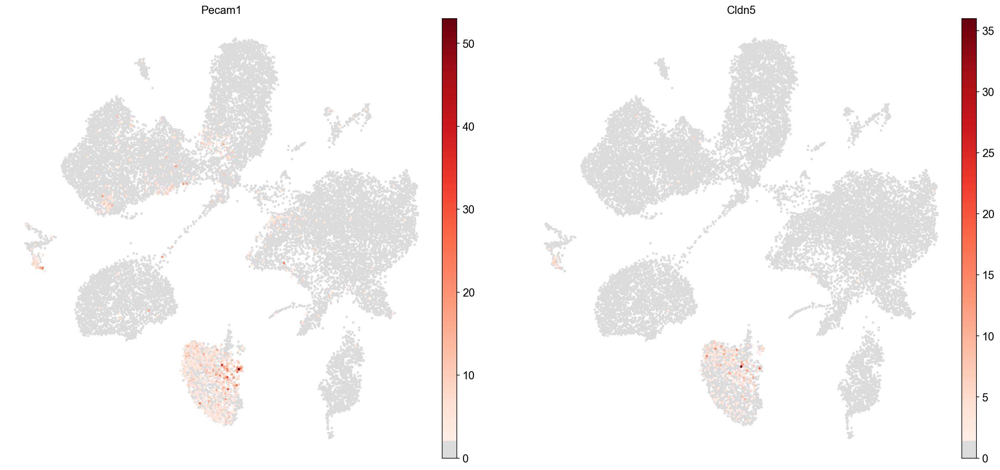

In [343]:
sc.pl.umap(adata, color=["Pecam1", "Cldn5"],  legend_fontsize=12, legend_fontoutline=12,
           frameon=False, size=35,cmap=newcmp, use_raw=True, save=f'umap_plot{img_tag}.png')
# Show the UMAP plot
pl.show()


In [ ]:
        "Monocytes/macrophages/Platelet": ['C1qa', 'Cd14', 'Pf4', 'Lyz2', 'Ms4a7'],
        "Mature type IIA and IIB fiber": ['Myh4', 'Myh2', 'Myh1', 'Acta1'],
        "Residence Macrophages/APC": ['Cd74', 'H2-Aa', 'H2-Eb1'],
        "Myo-Fibroblast": ['Cthrc1', 'Col1a1', 'Col3a1'],
        "MuSCs and Myoblasts": ['Myod1', 'Pax7', 'Sdc4'],
        "Fibroblast": ['Pdgfra', 'Gsn', 'Lum'],
        "Endothelial cells 1": ['Pecam1', 'Cldn5', 'Vwf'],
        "Endothelial cells": ['Pecam1', 'Cldn5', 'Vwf'],
        "MuSCs and myogenic progenitor cells": ['Pax7', 'Myf5', 'Myog'],
        "Anti-inflammatory Macrophages": ['Cd163', 'Lyve1', 'Mrc1'],
        "Neutrophils": ['S100a9', 'S100a8', 'Trem1'],
        "Fibroblast2": ['Pdgfra', 'Gsn', 'Lum'],
        "Proliferating immune cells": ['Sparc', 'Cd68', 'Cd14', 'Cenpe'],
        "Bcells and Residence Macrophages/APC": ['Igkc', 'H2-Eb1', 'Cd79a'],
        "Pericyte cells": ['Rgs5', 'Kcnj8', 'Acta2'],
        "T-lymphocytes and Natural killer cells": ['Cd3d', 'Ptprc', 'Nkg7'],
        "Tenocyte": ['Mkx', 'Fmod', 'Tnmd'],
        "Endothelial cells 2": ['Pecam1', 'Cldn5', 'Vwf'],
        "Schwann cells": ['Cdh19', 'Mpz', 'Kcna1'],
        
   